## SETUP

In [ ]:
## Imports

import os
import cv2
import numpy as np

import torch
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt

import random


def seed_everything(seed=42):
  """
  Seeds the random number generators from PyTorch, Python's random module,
  and NumPy to ensure reproducibility in deep learning experiments.

  Args:
      seed (int, optional): The desired seed value. Defaults to 42. 
  """
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)
  torch.cuda.manual_seed_all(seed)  # If using multi-GPU
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False
  
  random.seed(seed)
  
  np.random.seed(seed)

# Example usage:
seed_everything(seed=100)  

# Now, any PyTorch, Python random, or NumPy operation that relies 
# on random number generation will produce deterministic results. 


In [4]:
#List of models underconsideration for text generation
from transformers import AutoTokenizer, AutoProcessor

model_path ="microsoft/biogpt"

#processor = AutoProcessor.from_pretrained(model_path, trust_remote_code=True)
tokenizer = AutoTokenizer.from_pretrained(model_path)

# image_encoder = AutoModel.from_pretrained("llava-hf/llava-v1.6-mistral-7b-hf")
# text_summarizer = pipeline("summarization", model="microsoft/biogpt")
# text_embedder = SentenceTransformer('all-mpnet-base-v2')

# """
# "google-bert/bert-large-uncased"
# "microsoft/biogpt"
# "/home2/kunal/test/Meta-Llama-3-8B"
# "microsoft/biogpt"
# "meta-llama/Llama-2-7b-hf"
# "openlm-research/open_llama_7b"
# "llava-hf/llava-v1.6-mistral-7b-hf"
# "microsoft/Florence-2-base"
# "llava-hf/llava-v1.6-mistral-7b-hf" 
# """

In [5]:
from langchain_core.output_parsers import StrOutputParser
from langchain_core.prompts import ChatPromptTemplate
from transformers import AutoTokenizer
from langchain import HuggingFacePipeline

import torch

from transformers import AutoTokenizer, LlavaNextForConditionalGeneration, LlamaTokenizer, LlamaForCausalLM, AutoModelForCausalLM
from transformers import LlavaNextProcessor, LlavaNextForConditionalGeneration, BioGptForCausalLM


model = AutoModelForCausalLM.from_pretrained(
    model_path,  #device_map='auto',
).eval().cuda()


In [6]:
from transformers import pipeline

pipeline = pipeline(
    "text-generation", #task
    model=model,
    tokenizer=tokenizer,
    #torch_dtype=torch.bfloat16,
    trust_remote_code=True,
    device = "cuda:0",
    #device_map="auto",
    max_length=200,
    max_new_tokens=500,
    do_sample=True,
    top_k=10,
    num_return_sequences=1,
    eos_token_id=tokenizer.eos_token_id
)

In [7]:
llm = HuggingFacePipeline(pipeline = pipeline, model_kwargs = {'temperature':0.5}) # 0 is fixed response, 0.5 for multiple generative responses

/home/kunal/miniconda3/lib/python3.8/site-packages/langchain_core/_api/deprecation.py:139: LangChainDeprecationWarning: The class `HuggingFacePipeline` was deprecated in LangChain 0.0.37 and will be removed in 0.3. An updated version of the class exists in the langchain-huggingface package and should be used instead. To use it run `pip install -U langchain-huggingface` and import as `from langchain_huggingface import HuggingFacePipeline`.
  warn_deprecated(


In [8]:
# Prompt

from langchain import PromptTemplate,  LLMChain

# prompt_text = """You are an assistant tasked with summarizing tables and text. \
# Give a concise summary of the table or text. Table or text chunk: {element} """
# prompt = ChatPromptTemplate.from_template(prompt_text)


template = """
              Rephrase the following text delimited by triple backquotes.
              Return your response in one line which covers the key points of the text in the context for arthoscopic surgery.
              ```{element}```
              RESPONSE:
           """



# Summary chain

prompt = PromptTemplate(template=template, input_variables=["text"])

llm_chain = LLMChain(prompt=prompt, llm=llm)

/home/kunal/miniconda3/lib/python3.8/site-packages/langchain_core/_api/deprecation.py:139: LangChainDeprecationWarning: The class `LLMChain` was deprecated in LangChain 0.1.17 and will be removed in 1.0. Use RunnableSequence, e.g., `prompt | llm` instead.
  warn_deprecated(


In [9]:
summarize_chain  = llm_chain

In [10]:
summarize_chain

LLMChain(prompt=PromptTemplate(input_variables=['element'], template='\n              Rephrase the following text delimited by triple backquotes.\n              Return your response in one line which covers the key points of the text in the context for arthoscopic surgery.\n              ```{element}```\n              RESPONSE:\n           '), llm=HuggingFacePipeline(pipeline=<transformers.pipelines.text_generation.TextGenerationPipeline object at 0x7f2d49418730>, model_kwargs={'temperature': 0.5}))

In [11]:
shapes ={
    "acorn_reamer": "A small, round, and metallic object with a textured or fluted surface",
    "all_inside_meniscus_repair_device": "A low-profile, tubular device, potentially with a handle mechanism on one end",
    "curette": "A thin, elongated instrument with a small, scooped or looped end",
    "drill_bit_and_grasper": "A combination tool with a sharp, pointed, and possibly rotating bit alongside a grasping mechanism with jaws",
    "fiberstick_suture": "A thin, flexible thread-like structure, potentially appearing slightly thicker due to the attached suture material",
    "forceps": "Two thin arms joined at a pivot point, resembling a pair of tweezers, with a variety of possible end shapes (toothed, smooth, etc.)",
    "inside_out_meniscal_repair_guide": "A curved or angled tube-like structure, potentially with markings or gradations on its surface",
    "meniscus_single_pass_suture_device": "A slender, elongated device, possibly with a needle or delivery mechanism at one end, designed for a single, efficient pass",
    "microfracture_awl": "A delicate, pointed tool, similar in appearance to a very fine awl or pick."
}

In [12]:
## Generate responses from the model

Responses  = []
CLS_Names = []
for cls, shape in shapes.items():
   
    print("################################################################################")
    for i in range(5):

        CLS_Names.append(cls)
        text_summaries = summarize_chain.batch([shape])
        print(cls,":",text_summaries[0]["text"].split("RESPONSE:\n")[-1])

        Responses.append(text_summaries[0]["text"].split("RESPONSE:\n")[-1])
    print("\n \n")

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


################################################################################


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


acorn_reamer :             metallic object with a fluted surface.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


acorn_reamer :             small and round object (s) with a fluted surface.The second and the third point of the text is the textured or fluted surfaceIt is the most appropriate for arthroscopy of the hip joint.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


acorn_reamer :             the metallic object with a textured surfaceIt is a small and round object with a fluted surface It is a small, round, and metallic object without a textured surfaceIt is a small and round object with a fluted surfaceIt is a small, round, and metallic object Without textured and fluted surfaceIt is a small, round, and metallic object Without textured and fluted surface.A small, round and metallic object without a textured and fluted surfaceIt is a small round and metallic object with a fluted surface It is a small, round, and metallic object Without textured and fluted surfaceIt is a small, round, and metallic object Without textured and fluted surfaceIt is a small, round, and metallic object Without textured and fluted surfaceIt is a small round and metallic object with a fluted surfaceIt is a small, round, and metallic object without a textured and fluted surfaceIt is a small round and metallic object Without textured and fluted surfaceIt is a small round an

Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


acorn_reamer :             A small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic object with a fluted surfaceThe small, round, and metallic object with a fluted surfaceThere is a small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic object with a fluted surfaceThe small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic object with a textured or fluted surfaceThere is a small round and metallic object with a textured or fluted surface.A small, round, and metallic object with a fluted or textured surfacesThere is a small, round, and metallic object with a fluted or textured surfa

Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


all_inside_meniscus_repair_device :             The authors declare that your response to the text is a sketch of what you should consider the following: The authors declare that your response does not necessarily reflect the level of the knowledge that you have in the field of arthroscopy.
all_inside_meniscus_repair_device :             One-level, minimally invasive, minimally invasive, less invasive.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


all_inside_meniscus_repair_device :             What is the current status of the use of the RESPONSE?


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


all_inside_meniscus_repair_device :             We can say that this system was not designed for use in the hands of an individual, and therefore not suitable for use in a clinical environment, but can be used to help improve ergonomics.


You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


all_inside_meniscus_repair_device :             A low-profile, tubular device, potentially with a handle mechanism on the other endósty.When searching for the optimal working point of a low-profile device in a specific region and using a low-profile, tubular device with a handle mechanism in a specific region and using a low-profile, tubular device with a handle mechanism on one endósty.The following key points for surgeons and surgeons' awareness of the use of an endósty.-A low-profile, tubular device, potentially with a handle mechanism on one endósty.-In the case of a low-profile, tubular device, a low-profile, tubular device that has a handle mechanism in the specific region and that is connected via a handle mechanism on one endósty.In the case of an endósty.-A low-profile, tubular device with a handle mechanism in a specific region and using a low-profile, tubular device with a handle mechanism in a specific region, and when searching for the optimal working point of a low-profil

Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


curette :             In general, thularesinoids can be performed by means of the following approaches: The anteromedial approach, the antero-lateral approach, the anterocentral approach and the antero-lateral approach with the use ofa short, looped or scooped endosin.All techniques of arthoscopic surgery are described and their advantages and disadvantages are presented and discussed in this article.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


curette :             The use of an osteotome or a mini-osteotome should be reserved to surgeons who have a good surgical experience with these tools.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


curette :             In the case of a thin, elongated instrument a small, scooped or looped endóronavigation is preferable to a large, sharp instrument.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


curette :             We have made use of various instruments for arthoscopy: arthroscope, arthroscope combined with an endoscope, and arthroscope combined with an operating microscope.

 

################################################################################


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


drill_bit_and_grasper :             We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit with jawsoring mechanism in a combination tool with a sharp, pointed, and rotating bit with jawsoring mechanism to perform an arthroscope.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


drill_bit_and_grasper :             • In case of a large defect of the lateral condyle or the lateral part of the glenoid, an arthrodesing of the joint capsule and bone graft (if possible) can be the method of choice.
drill_bit_and_grasper :             A combination tool which has to be chosen to be a part of the arthroscopic surgery to be performed.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


drill_bit_and_grasper :             In this situation the patient will be able to have more time with the doctor or the patient to talk about his pain, the feeling of swelling or tenderness, and the feeling of swelling in the shoulder joint.
drill_bit_and_grasper :             It is important in arthoscopy to know how to use the appropriate tools.

 

################################################################################


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


fiberstick_suture :             A single-row, flexible thread-like structure.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


fiberstick_suture :             a thin fibrous structure, potentially appearing slightly thicker due to the attached suture materialThere is no evidence of the existence of such a structure in the joint.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


fiberstick_suture :             a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, potentially appearing slightly thicker due to attached suture material.Selectivity: a very thin or a thinly thick suture material.RESPONSE. The following text covers the key points of the text in the context for arthoscopic surgery.
fiberstick_suture :             the "thin, flat, and thin" thread-like structure.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


fiberstick_suture :             thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened due to the suture materialsin arthoscopic surgery.

 

################################################################################


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


forceps :             One thick line with four tweezers, a pair of tweezers, or a pair of tweezers.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


forceps :             Three-point arms are a useful tool in the hands of an experienced arthroscopist and are very helpful in making sense of the information.
forceps :             Two thin arms joined at a pivot point resembling a pair of tweezers.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


forceps :             The main purpose of the present study was to identify the most common surgical approaches for the treatment of femoroacetabular impingement, in order to help orthopaedic surgeons to choose the most effective and safe surgical technique to perform.
forceps :             A tweezer.

 

################################################################################


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


inside_out_meniscal_repair_guide :             In this regard, the following article, the second on the subject, has been addressed by the authors.
inside_out_meniscal_repair_guide :             A curved or angled tube-like structure.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


inside_out_meniscal_repair_guide :             In addition to the above, you will also refer to the following text which is an example of an artistic structure that has been developed by the author of the paper, as an example of a "new art" in the sense of art.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


inside_out_meniscal_repair_guide :             curved tube-like structure with markings on its surface, potentially with markings or gradations on its surface.
inside_out_meniscal_repair_guide :             Somewhat more than you could imagine.

 

################################################################################


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


meniscus_single_pass_suture_device :             The needle or delivery mechanism may be a passable device.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


meniscus_single_pass_suture_device :             The needle is connected to the tip of the device with a stylet which is inserted to a depth of 3 cm.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


meniscus_single_pass_suture_device :             A slender ultrasound device, designed by the authors at one side, for single, efficient passosinóne surgery.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


meniscus_single_pass_suture_device :             A slender device, with a needle or delivery mechanism at one end, designed for single, efficient passovering at one end of a device.
meniscus_single_pass_suture_device :            

 

################################################################################
microfracture_awl :             the use of the needle in the arthroscopic procedure.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


microfracture_awl :             The reader should note that the reader should use only the phrase "the fine and delicate," and not the word "awl."


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


microfracture_awl :             a sharp, pointed, fine awl, or pick.The author declares that the phrase "a fine awl or pick." is a very important and very important tool for the development and application of arthoscopic surgical techniques.


Both `max_new_tokens` (=500) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


microfracture_awl :             It is important to have a clear understanding of the technique and its limitations so that you can use the appropriate surgical technique in a safe and efficient way for patients and surgeons.
microfracture_awl :             the surgeon, surgeon who is familiar with the technique of arthroscopy and the surgical instruments, is in the forefront of this discussion.

 



In [13]:
## Prepare Data

In [14]:
## Read Xlxs file in pandas
file_name = "Multimodal_Rephrases.xlsx"

In [15]:

dfs = pd.read_excel(file_name) #, index_col=0)
print(dfs.head()) # print the first 5 rows

#dfs = pd.read_excel(file_name, sheet_name=None)

      RESPONSES                                            CHATGPT  \
0  Acorn reamer  A small, metallic object with a textured or gr...   
1  Acorn reamer  A compact, rounded metallic tool featuring a t...   
2  Acorn reamer  A small, spherical metal tool with a fluted or...   
3  Acorn reamer  A small, round metal tool with a grooved or te...   
4  Acorn reamer  A small, circular metal tool featuring a groov...   

                                              GEMINI  \
0  A small, cylindrical metal tool with a texture...   
1           A miniature reamer with a rounded shape.   
2  A tiny, fluted metal instrument used for drill...   
3  A small, round tool with a textured cutting edge.   
4  A compact, metallic reamer with a grooved surf...   

                                           CLAUDE AI  \
0  A compact, spherical metal tool with a grooved...   
1  A diminutive, orb-shaped implement featuring a...   
2  A petite, globular metallic instrument with a ...   
3  A small, ball-l

In [16]:
dfs

,RESPONSES,CHATGPT,GEMINI,CLAUDE AI,LLAVA NEXT 1.6 MISTRAL
0,Acorn reamer,"A small, metallic object with a textured or gr...","A small, cylindrical metal tool with a texture...","A compact, spherical metal tool with a grooved...",An object with a metal surface that has a text...
1,Acorn reamer,"A compact, rounded metallic tool featuring a t...",A miniature reamer with a rounded shape.,"A diminutive, orb-shaped implement featuring a...","A small, round, and metallic object with a flu..."
2,Acorn reamer,"A small, spherical metal tool with a fluted or...","A tiny, fluted metal instrument used for drill...","A petite, globular metallic instrument with a ...","A tiny, circular, and metallic item with a tex..."
3,Acorn reamer,"A small, round metal tool with a grooved or te...","A small, round tool with a textured cutting edge.","A small, ball-like metal device adorned with i...","A small, round, and metallic object, possibly ..."
4,Acorn reamer,"A small, circular metal tool featuring a groov...","A compact, metallic reamer with a grooved surf...","A tiny, rounded metallic apparatus with a text...",An object with a metallic finish and a texture...
5,All inside meniscus repair device,"A sleek, tubular device, possibly equipped wit...","A low-profile, tubular device with a handle fo...","A slender, cylindrical instrument, possibly fe...","A cylindrical instrument with a rounded end, p..."
6,All inside meniscus repair device,"A narrow, cylindrical device, often featuring ...","A slender, tubular instrument for internal men...","A compact, rod-shaped tool with a potential co...","A sleek, cylindrical apparatus, possibly featu..."
7,All inside meniscus repair device,"A compact, tubular device, possibly with a han...","A small, cylindrical device for repairing the ...","A narrow, elongated apparatus, perhaps includi...","A slender, cylindrical object that could featu..."
8,All inside meniscus repair device,"A slender, tubular device, possibly having a h...","A low-profile, tubular tool with a handle mech...","A slim, tube-like implement that may incorpora...","A compact, cylindrical instrument with a handl..."
9,All inside meniscus repair device,"A compact, tubular device that may have a hand...","A slender, cylindrical device for internal men...","A streamlined, cylindrical device, potentially...","A long, tube-like instrument with a handle on ..."


In [17]:
dfs.columns

Index(['RESPONSES', 'CHATGPT', 'GEMINI', 'CLAUDE AI',
       'LLAVA NEXT 1.6 MISTRAL'],
      dtype='object')

In [18]:
dfs.index

RangeIndex(start=0, stop=45, step=1)

In [19]:
dfs['Index_Col'] = range(1, len(dfs) + 1)


In [20]:
dfs.set_index('Index_Col', inplace=True)

In [21]:
dfs.columns = dfs.columns.str.replace('RESPONSES', 'CLS')

In [22]:
dfs

,CLS,CHATGPT,GEMINI,CLAUDE AI,LLAVA NEXT 1.6 MISTRAL
Index_Col,,,,,
1,Acorn reamer,"A small, metallic object with a textured or gr...","A small, cylindrical metal tool with a texture...","A compact, spherical metal tool with a grooved...",An object with a metal surface that has a text...
2,Acorn reamer,"A compact, rounded metallic tool featuring a t...",A miniature reamer with a rounded shape.,"A diminutive, orb-shaped implement featuring a...","A small, round, and metallic object with a flu..."
3,Acorn reamer,"A small, spherical metal tool with a fluted or...","A tiny, fluted metal instrument used for drill...","A petite, globular metallic instrument with a ...","A tiny, circular, and metallic item with a tex..."
4,Acorn reamer,"A small, round metal tool with a grooved or te...","A small, round tool with a textured cutting edge.","A small, ball-like metal device adorned with i...","A small, round, and metallic object, possibly ..."
5,Acorn reamer,"A small, circular metal tool featuring a groov...","A compact, metallic reamer with a grooved surf...","A tiny, rounded metallic apparatus with a text...",An object with a metallic finish and a texture...
6,All inside meniscus repair device,"A sleek, tubular device, possibly equipped wit...","A low-profile, tubular device with a handle fo...","A slender, cylindrical instrument, possibly fe...","A cylindrical instrument with a rounded end, p..."
7,All inside meniscus repair device,"A narrow, cylindrical device, often featuring ...","A slender, tubular instrument for internal men...","A compact, rod-shaped tool with a potential co...","A sleek, cylindrical apparatus, possibly featu..."
8,All inside meniscus repair device,"A compact, tubular device, possibly with a han...","A small, cylindrical device for repairing the ...","A narrow, elongated apparatus, perhaps includi...","A slender, cylindrical object that could featu..."
9,All inside meniscus repair device,"A slender, tubular device, possibly having a h...","A low-profile, tubular tool with a handle mech...","A slim, tube-like implement that may incorpora...","A compact, cylindrical instrument with a handl..."


In [23]:
dfs.columns

Index(['CLS', 'CHATGPT', 'GEMINI', 'CLAUDE AI', 'LLAVA NEXT 1.6 MISTRAL'], dtype='object')

In [24]:
classes = set(dfs["CLS"])

In [25]:
classes

{'Acorn reamer',
 'All inside meniscus repair device',
 'Curette',
 'Drill bit and grasper',
 'Fiberstick suture',
 'Forceps',
 'Inside Out Meniscal Repair Guide',
 'Meniscus Single Pass Suture Device',
 'Microfracture Awl'}

In [26]:
cls_to_id = {}
id_to_cls = {}

for idx, cls in enumerate(classes):
    id_to_cls[idx] = cls
    cls_to_id[cls] = idx
    

In [27]:
cls_to_id

{'Fiberstick suture': 0,
 'Drill bit and grasper': 1,
 'Acorn reamer': 2,
 'Inside Out Meniscal Repair Guide': 3,
 'Forceps': 4,
 'All inside meniscus repair device': 5,
 'Microfracture Awl': 6,
 'Curette': 7,
 'Meniscus Single Pass Suture Device': 8}

In [28]:
id_to_cls

{0: 'Fiberstick suture',
 1: 'Drill bit and grasper',
 2: 'Acorn reamer',
 3: 'Inside Out Meniscal Repair Guide',
 4: 'Forceps',
 5: 'All inside meniscus repair device',
 6: 'Microfracture Awl',
 7: 'Curette',
 8: 'Meniscus Single Pass Suture Device'}

In [29]:
#validate mapping
list(zip(dfs["CLS"],CLS_Names))

[('Acorn reamer', 'acorn_reamer'),
 ('Acorn reamer', 'acorn_reamer'),
 ('Acorn reamer', 'acorn_reamer'),
 ('Acorn reamer', 'acorn_reamer'),
 ('Acorn reamer', 'acorn_reamer'),
 ('All inside meniscus repair device', 'all_inside_meniscus_repair_device'),
 ('All inside meniscus repair device', 'all_inside_meniscus_repair_device'),
 ('All inside meniscus repair device', 'all_inside_meniscus_repair_device'),
 ('All inside meniscus repair device', 'all_inside_meniscus_repair_device'),
 ('All inside meniscus repair device', 'all_inside_meniscus_repair_device'),
 ('Curette', 'curette'),
 ('Curette', 'curette'),
 ('Curette', 'curette'),
 ('Curette', 'curette'),
 ('Curette', 'curette'),
 ('Drill bit and grasper', 'drill_bit_and_grasper'),
 ('Drill bit and grasper', 'drill_bit_and_grasper'),
 ('Drill bit and grasper', 'drill_bit_and_grasper'),
 ('Drill bit and grasper', 'drill_bit_and_grasper'),
 ('Drill bit and grasper', 'drill_bit_and_grasper'),
 ('Fiberstick suture', 'fiberstick_suture'),
 ('Fi

In [30]:
Responses = [r.lstrip()[:100] for r in Responses]

In [31]:
Responses

['metallic object with a fluted surface.',
 'small and round object (s) with a fluted surface.The second and the third point of the text is the t',
 'the metallic object with a textured surfaceIt is a small and round object with a fluted surface It i',
 'A small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic ',
 'a tiny, round, and metallic object with a fluted or textured surface.',
 'The authors declare that your response to the text is a sketch of what you should consider the follo',
 'One-level, minimally invasive, minimally invasive, less invasive.',
 'What is the current status of the use of the RESPONSE?',
 'We can say that this system was not designed for use in the hands of an individual, and therefore no',
 'A low-profile, tubular device, potentially with a handle mechanism on the other endósty.When searchi',
 'The most frequently performed surgical treatment of the degenerative meniscus disease is a meniscoto',
 'In general, thula

In [32]:
dfs['BIOGPT'] = Responses

In [33]:
dfs #final data

,CLS,CHATGPT,GEMINI,CLAUDE AI,LLAVA NEXT 1.6 MISTRAL,BIOGPT
Index_Col,,,,,,
1,Acorn reamer,"A small, metallic object with a textured or gr...","A small, cylindrical metal tool with a texture...","A compact, spherical metal tool with a grooved...",An object with a metal surface that has a text...,metallic object with a fluted surface.
2,Acorn reamer,"A compact, rounded metallic tool featuring a t...",A miniature reamer with a rounded shape.,"A diminutive, orb-shaped implement featuring a...","A small, round, and metallic object with a flu...",small and round object (s) with a fluted surfa...
3,Acorn reamer,"A small, spherical metal tool with a fluted or...","A tiny, fluted metal instrument used for drill...","A petite, globular metallic instrument with a ...","A tiny, circular, and metallic item with a tex...",the metallic object with a textured surfaceIt ...
4,Acorn reamer,"A small, round metal tool with a grooved or te...","A small, round tool with a textured cutting edge.","A small, ball-like metal device adorned with i...","A small, round, and metallic object, possibly ...","A small, round, and metallic object with a tex..."
5,Acorn reamer,"A small, circular metal tool featuring a groov...","A compact, metallic reamer with a grooved surf...","A tiny, rounded metallic apparatus with a text...",An object with a metallic finish and a texture...,"a tiny, round, and metallic object with a flut..."
6,All inside meniscus repair device,"A sleek, tubular device, possibly equipped wit...","A low-profile, tubular device with a handle fo...","A slender, cylindrical instrument, possibly fe...","A cylindrical instrument with a rounded end, p...",The authors declare that your response to the ...
7,All inside meniscus repair device,"A narrow, cylindrical device, often featuring ...","A slender, tubular instrument for internal men...","A compact, rod-shaped tool with a potential co...","A sleek, cylindrical apparatus, possibly featu...","One-level, minimally invasive, minimally invas..."
8,All inside meniscus repair device,"A compact, tubular device, possibly with a han...","A small, cylindrical device for repairing the ...","A narrow, elongated apparatus, perhaps includi...","A slender, cylindrical object that could featu...",What is the current status of the use of the R...
9,All inside meniscus repair device,"A slender, tubular device, possibly having a h...","A low-profile, tubular tool with a handle mech...","A slim, tube-like implement that may incorpora...","A compact, cylindrical instrument with a handl...",We can say that this system was not designed f...


In [34]:
## Create DATA 

data = {}

for idx in range(0,len(dfs.index)):
    values = dfs.values[idx]
    print(values)
    cls = values[0]
    if cls not in data.keys():
        data[cls] =[]
    for v in values[1:]:
        data[cls].append(v)

['Acorn reamer'
 'A small, metallic object with a textured or grooved spherical surface.'
 'A small, cylindrical metal tool with a textured surface.'
 'A compact, spherical metal tool with a grooved exterior'
 'An object with a metal surface that has a textured or fluted pattern, shaped like a circle, is depicted in the image.'
 'metallic object with a fluted surface.']
['Acorn reamer'
 'A compact, rounded metallic tool featuring a textured or grooved surface.'
 'A miniature reamer with a rounded shape.'
 'A diminutive, orb-shaped implement featuring a ridged surface'
 'A small, round, and metallic object with a fluted or textured exterior, A small, round, and metallic object with a fluted or textured design.'
 'small and round object (s) with a fluted surface.The second and the third point of the text is the t']
['Acorn reamer'
 'A small, spherical metal tool with a fluted or textured exterior.'
 'A tiny, fluted metal instrument used for drilling.'
 'A petite, globular metallic instru

In [35]:
len(data['Acorn reamer'])

25

In [36]:
data.keys()

dict_keys(['Acorn reamer', 'All inside meniscus repair device', 'Curette', 'Drill bit and grasper', 'Fiberstick suture', 'Forceps', 'Inside Out Meniscal Repair Guide', 'Meniscus Single Pass Suture Device', 'Microfracture Awl'])

In [37]:
for key, value in data.items():
    random.shuffle(value) 
## shuffle the data randomly for each model response

In [38]:
data

{'Acorn reamer': ['A miniature reamer with a rounded shape.',
  'A small, circular metal tool featuring a grooved or textured surface.',
  'A small, spherical metal tool with a fluted or textured exterior.',
  'A small, round, and metallic object, possibly a tool or a part of a larger assembly, with a textured or fluted surface.',
  'A small, round, and metallic object with a fluted or textured exterior, A small, round, and metallic object with a fluted or textured design.',
  'A tiny, rounded metallic apparatus with a textured outer layer',
  'A compact, spherical metal tool with a grooved exterior',
  'small and round object (s) with a fluted surface.The second and the third point of the text is the t',
  'A compact, metallic reamer with a grooved surface.',
  'A small, round metal tool with a grooved or textured surface.',
  'A small, metallic object with a textured or grooved spherical surface.',
  'a tiny, round, and metallic object with a fluted or textured surface.',
  'A diminu

In [39]:
##### Data preparation ends ######################

In [40]:
## Step 2: description extraction

In [41]:
# `Option 2:` 

# * Use multimodal embeddings (such as [CLIP](https://openai.com/research/clip)) to embed images and text
# * Retrieve both using similarity search
# * Pass raw images and text chunks to a multimodal LLM for answer synthesis 

In [42]:
# llava_processor = LlavaNextProcessor.from_pretrained("llava-hf/llava-v1.6-mistral-7b-hf")

# model_image     = LlavaNextForConditionalGeneration.from_pretrained("llava-hf/llava-v1.6-mistral-7b-hf", torch_dtype=torch.float16, low_cpu_mem_usage=True).eval() 
# model_image.cuda()


In [43]:
#Step 3: Add Vector Storage

In [44]:
import uuid

from langchain.retrievers.multi_vector import MultiVectorRetriever
from langchain.storage import InMemoryStore
from langchain_community.vectorstores import Chroma
from langchain_core.documents import Document
#from langchain_openai import OpenAIEmbeddings
from langchain.embeddings import HuggingFaceEmbeddings, SentenceTransformerEmbeddings

from typing import List

from collections import defaultdict
from langchain_core.callbacks import CallbackManagerForRetrieverRun


# class CustomMultiVectorRetriever(MultiVectorRetriever):
#     def _get_relevant_documents(
#         self, query: str, *, run_manager: CallbackManagerForRetrieverRun
#     ) -> List[Document]:
#         """Get documents relevant to a query.
#         Args:
#             query: String to find relevant documents for
#             run_manager: The callbacks handler to use
#         Returns:
#             List of relevant documents
#         """
#         results = self.vectorstore.similarity_search_with_score(
#             query, **self.search_kwargs
#         )

#         # Map doc_ids to list of sub-documents, adding scores to metadata
#         id_to_doc = defaultdict(list)
#         # print("results:", results)
#         for doc, score in results:
#             # print( doc.metadata )
#             # print( "doc:", type(doc), doc)
#             # print( "score:", score)
#             doc_id = doc.metadata.get("doc_id")
#             if doc_id:
#                 doc.metadata["score"] = score
#                 id_to_doc[doc_id].append(doc)

#         # Fetch documents corresponding to doc_ids, retaining sub_docs in metadata
#         docs = []

#         print(id_to_doc)
#         for _id, sub_docs in id_to_doc.items():
#             docstore_docs = self.docstore.mget([_id])
#             print("sub_docs:",sub_docs)
#             print("docstore_docs:",docstore_docs)
#             if docstore_docs:
#                 if doc := docstore_docs[0]:
#                     #doc.metadata["sub_docs"] = sub_docs
#                     doc += (sub_docs[0].metadata["score"],)
#                     docs.append(doc)

                
#         return docs


In [45]:
# The vectorstore to use to index the child chunks
vectorstore = Chroma(collection_name="summaries", embedding_function = HuggingFaceEmbeddings(model_name="sentence-transformers/all-mpnet-base-v2"))


/home/kunal/miniconda3/lib/python3.8/site-packages/langchain_core/_api/deprecation.py:139: LangChainDeprecationWarning: The class `HuggingFaceEmbeddings` was deprecated in LangChain 0.2.2 and will be removed in 0.3.0. An updated version of the class exists in the langchain-huggingface package and should be used instead. To use it run `pip install -U langchain-huggingface` and import as `from langchain_huggingface import HuggingFaceEmbeddings`.
  warn_deprecated(


In [46]:
# The storage layer for the parent documents
store = InMemoryStore()
id_key = "doc_id"

# The retriever (empty to start)
retriever = MultiVectorRetriever( # #CustomMultiVectorRetriever
    vectorstore=vectorstore,
    docstore=store,
    id_key=id_key,

    search_kwargs={"k": 5} #"additional": ["vector", "certainty", "id"]
)

In [47]:
# dfs.columns
# Index(['CLS', 'CHATGPT', 'GEMINI', 'CLAUDE AI', 'LLAVA NEXT 1.6 MISTRAL'], dtype='object')

In [48]:
Responses = {
    'CHATGPT':list(zip(dfs['CLS'], dfs['CHATGPT'])),
    'GEMINI' :list(zip(dfs['CLS'], dfs['GEMINI'])),
    'CLAUDE AI':list(zip(dfs['CLS'], dfs['CLAUDE AI'])),
    'LLAVA NEXT 1.6 MISTRAL':list(zip(dfs['CLS'], dfs['LLAVA NEXT 1.6 MISTRAL'])),
    'BIOGPT':list(zip(dfs['CLS'], dfs['BIOGPT'])),


}

In [49]:
Responses.keys()

dict_keys(['CHATGPT', 'GEMINI', 'CLAUDE AI', 'LLAVA NEXT 1.6 MISTRAL', 'BIOGPT'])

In [50]:
for key in Responses.keys():
    im_texts = Responses[key]
    
    # Add texts
    doc_ids = [str(uuid.uuid4()) for _ in im_texts]
    summary_texts = [
        Document(page_content=s[1], metadata={id_key: doc_ids[i]})  # access the text
        for i, s in enumerate(im_texts)
    ]

    retriever.vectorstore.add_documents(summary_texts)
    retriever.docstore.mset(list(zip(doc_ids, im_texts)))

## Save GT responses to the memory

In [51]:
summary_texts

[Document(metadata={'doc_id': 'cc1205ff-dcfb-4dff-83a5-e50c63a9189a'}, page_content='metallic object with a fluted surface.'),
 Document(metadata={'doc_id': 'b10c1972-f243-45fe-a0e1-09e0d7ec75cd'}, page_content='small and round object (s) with a fluted surface.The second and the third point of the text is the t'),
 Document(metadata={'doc_id': 'dbad0965-509e-47de-8e2a-ef682d125020'}, page_content='the metallic object with a textured surfaceIt is a small and round object with a fluted surface It i'),
 Document(metadata={'doc_id': '07b926c3-8c00-47ee-868b-95bfe6910ce6'}, page_content='A small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic '),
 Document(metadata={'doc_id': '508c2be1-d360-4637-b00e-fe1654457276'}, page_content='a tiny, round, and metallic object with a fluted or textured surface.'),
 Document(metadata={'doc_id': 'adecb70c-5da9-44dd-b0f9-9ab7efcc6393'}, page_content='The authors declare that your response to the text is a sketch 

## RETRIEVAL

In [52]:
processor = LlavaNextProcessor.from_pretrained("llava-hf/llava-v1.6-mistral-7b-hf")

vlm_model = LlavaNextForConditionalGeneration.from_pretrained("llava-hf/llava-v1.6-mistral-7b-hf", torch_dtype=torch.float16, low_cpu_mem_usage=True) 
vlm_model.to("cuda:0")



Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

LlavaNextForConditionalGeneration(
  (vision_tower): CLIPVisionModel(
    (vision_model): CLIPVisionTransformer(
      (embeddings): CLIPVisionEmbeddings(
        (patch_embedding): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
        (position_embedding): Embedding(577, 1024)
      )
      (pre_layrnorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (encoder): CLIPEncoder(
        (layers): ModuleList(
          (0-23): 24 x CLIPEncoderLayer(
            (self_attn): CLIPAttention(
              (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
            )
            (layer_norm1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
            (mlp): CLIPMLP(
              (activation_fn): Q

In [53]:
import matplotlib.pyplot as plt
import glob
import random
import base64
import pandas as pd

from PIL import Image
from io import BytesIO
from IPython.display import HTML


In [54]:
dir = "/home2/kunal/test/Subset_data/"

In [55]:
!ls /home2/kunal/test/Subset_data/

'Acorn reamer'			      Forceps
'All inside meniscus repair device'  'Inside Out Meniscal Repair Guide'
 Curette			     'Meniscus Single Pass Suture Device'
'Drill bit and grasper'		     'Microfracture Awl'
'Fiberstick suture'


In [56]:
## Create Options 

In [57]:
GTs = []
Opts = []

for folder in os.listdir(dir):
    print("GT folder:", folder)
    options = list(set(os.listdir(dir)).difference(set([folder])))
    options = options[:3]
    options.append(folder)
    random.shuffle(options)
    #print(options)

    GTs.append(folder)
    Opts.append(options)

print("\n##### Mapping:") 
for gt, opt in list(zip(GTs, Opts)):
    print("Ground Truth:", gt,"|", "Options:", opt)

GT folder: Microfracture Awl
GT folder: Acorn reamer
GT folder: All inside meniscus repair device
GT folder: Curette
GT folder: Drill bit and grasper
GT folder: Forceps
GT folder: Inside Out Meniscal Repair Guide
GT folder: Fiberstick suture
GT folder: Meniscus Single Pass Suture Device

##### Mapping:
Ground Truth: Microfracture Awl | Options: ['Fiberstick suture', 'Microfracture Awl', 'All inside meniscus repair device', 'Drill bit and grasper']
Ground Truth: Acorn reamer | Options: ['Acorn reamer', 'Drill bit and grasper', 'All inside meniscus repair device', 'Fiberstick suture']
Ground Truth: All inside meniscus repair device | Options: ['Inside Out Meniscal Repair Guide', 'Fiberstick suture', 'All inside meniscus repair device', 'Drill bit and grasper']
Ground Truth: Curette | Options: ['Drill bit and grasper', 'Curette', 'Fiberstick suture', 'All inside meniscus repair device']
Ground Truth: Drill bit and grasper | Options: ['Inside Out Meniscal Repair Guide', 'Drill bit and gras

In [65]:
mapping={"file_path":[], "options":[], "options_labels":[],"ground_truth":[], "ground_truth_options":[] }

for i in range(len(GTs)):
    gt    = GTs[i]

    for file in os.listdir(os.path.join(dir,gt)):
        
        opts   = Opts[i]
        mapping["file_path"].append(os.path.join(dir,gt,file))
        options    = []
        gt_options = []
        labels     = []
        
        for opt in opts:
            value = random.sample(data[opt],5)
            if gt==opt:
                gt_options+=value
            
            labels+= [opt]*5
            options+=value
        
        mapping["options"].append(options)
        mapping["options_labels"].append(labels)
        mapping["ground_truth"].append(gt)
        mapping["ground_truth_options"].append(gt_options)



In [66]:
# list(zip(mapping["file_path"], mapping["ground_truth"]))
mapping.keys()

dict_keys(['file_path', 'options', 'options_labels', 'ground_truth', 'ground_truth_options'])

In [68]:
mapping['file_path'][0]

'/home2/kunal/test/Subset_data/Microfracture Awl/video-62-945Z_39028.png'

In [69]:
list(zip(mapping["options_labels"][0],mapping['options'][0]))

[('Fiberstick suture',
  'a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p'),
 ('Fiberstick suture', 'A single-row, flexible thread-like structure.'),
 ('Fiberstick suture',
  'thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du'),
 ('Fiberstick suture',
  'A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.'),
 ('Fiberstick suture',
  'A delicate, pliable filament, potentially appearing robust due to attached surgical thread'),
 ('Microfracture Awl',
  'An instrument with a fine point, akin to a small awl or pick, is being used to navigate through a narrow, curved space.'),
 ('Microfracture Awl',
  'A small, pointed instrument resembling a tiny awl or pick, used for delicate procedures.'),
 ('Microfracture Awl',
  'A fine, sharp tool, akin to a miniature awl or pick, used for detailed surgical work.'),
 ('Microfracture Awl

In [70]:
mapping['ground_truth'][0]

'Microfracture Awl'

In [71]:
mapping['ground_truth_options'][0]

['An instrument with a fine point, akin to a small awl or pick, is being used to navigate through a narrow, curved space.',
 'A small, pointed instrument resembling a tiny awl or pick, used for delicate procedures.',
 'A fine, sharp tool, akin to a miniature awl or pick, used for detailed surgical work.',
 'A sharp, delicate tool, much like a fine awl or pick, used for precise incisions.',
 'The image showcases a slender, pointed instrument that resembles a tiny awl or pick, exhibiting a delicate and thin form.']

In [72]:
from sentence_transformers import SentenceTransformer, util

model = SentenceTransformer('all-mpnet-base-v2') # Example model


 
-------------------------------------------------
/home2/kunal/test/Subset_data/Microfracture Awl/video-62-945Z_39028.png


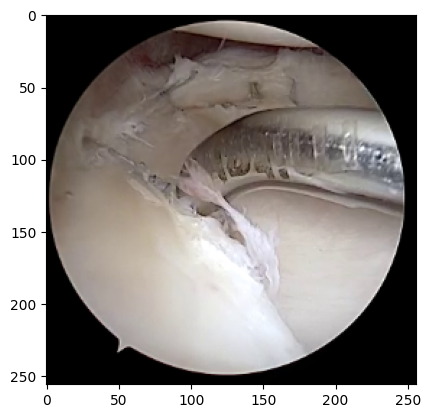

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.
We detected that you are passing `past_key_values` as a tuple and this is deprecated and will be removed in v4.43. Please use an appropriate `Cache` class (https://huggingface.co/docs/transformers/v4.41.3/en/internal/generation_utils#transformers.Cache)


Microfracture Awl: [INST]  
Describe the shape of the image? Select from options
0.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
1.A single-row, flexible thread-like structure.
2.thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du
3.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
4.A delicate, pliable filament, potentially appearing robust due to attached surgical thread
5.An instrument with a fine point, akin to a small awl or pick, is being used to navigate through a narrow, curved space.
6.A small, pointed instrument resembling a tiny awl or pick, used for delicate procedures.
7.A fine, sharp tool, akin to a miniature awl or pick, used for detailed surgical work.
8.A sharp, delicate tool, much like a fine awl or pick, used for precise incisions.
9.The image showcases a slender, pointed instrument that resembles a 

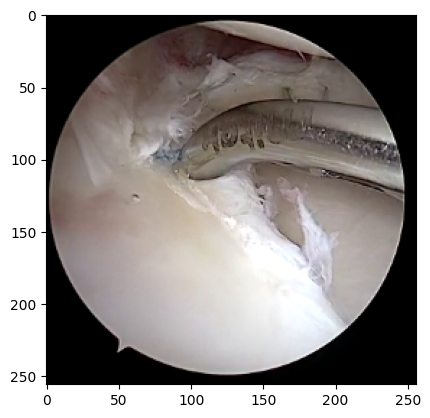

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Microfracture Awl: [INST]  
Describe the shape of the image? Select from options
0.A thin, supple fiber, potentially appearing beefier from attached surgical string
1.A delicate, flexible fiber with a suture incorporated.
2.A delicate, pliable filament, potentially appearing robust due to attached surgical thread
3.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
4.A fine, flexible thread, which may appear slightly thicker due to its attached suture material.
5.A small, sharp instrument that resembles a fine-tipped awl or pick.
6.the use of the needle in the arthroscopic procedure.
7.A sharp, delicate tool, much like a fine awl or pick, used for precise incisions.
8.A delicate, pointed tool for creating small fractures.
9.A fragile, sharp-tipped implement, akin to an ultra-fine piercing tool
10.A compact, rod-shaped tool with a potential control mechanism
11.A slender, tubular instrument for internal meniscus repair.
12

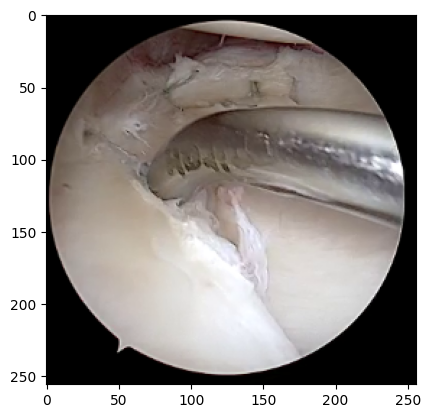

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Microfracture Awl: [INST]  
Describe the shape of the image? Select from options
0.A fine, bendable strand, possibly seeming more substantial with affixed suturing material
1.A slender, flexible fiber with a suture material incorporated.
2.A delicate, pliable filament, potentially appearing robust due to attached surgical thread
3.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
4.A slender, thread-like structure with a suture material attached.
5.A small, sharp instrument that resembles a fine-tipped awl or pick.
6.A delicate, pointed instrument for microfracture surgery.
7.It is important to have a clear understanding of the technique and its limitations so that you can u
8.A delicate, needle-like instrument, resembling a miniature pick or punch
9.An instrument with a fine point, akin to a small awl or pick, is being used to navigate through a narrow, curved space.
10.A slender, cylindrical object that could feature a grip on one si

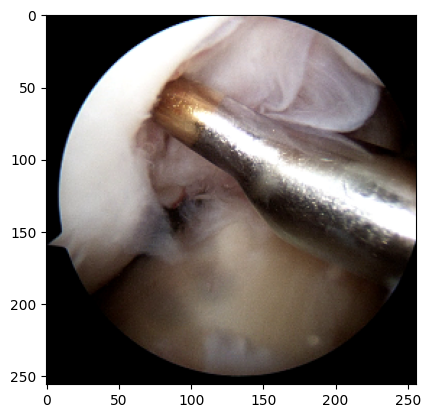

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Microfracture Awl: [INST]  
Describe the shape of the image? Select from options
0.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
1.A thin, flexible thread-like structure with a suture attached.
2.A slender, malleable cord, perhaps looking stouter owing to connected stitching thread
3.A flexible, thread-like structure, slightly thickened due to its suture material.
4.The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance.
5.A delicate, pointed tool, similar to a fine awl, used for creating precise microfractures.
6.A delicate, pointed instrument for microfracture surgery.
7.A fragile, sharp-tipped implement, akin to an ultra-fine piercing tool
8.A thin, needle-like instrument that is inserted into a medical procedure or surgery.
9.A delicate, pointed tool for creating small fractures.
10.A narrow, cylindrical device, often featurin

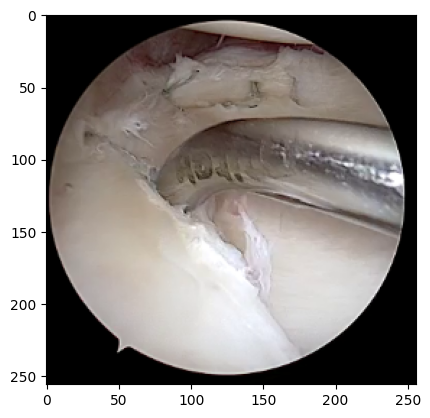

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Microfracture Awl: [INST]  
Describe the shape of the image? Select from options
0.A wispy, adaptable line, possibly seeming thicker due to bonded suture material
1.A thin, flexible thread-like structure that is noticeably thicker due to the attached suture material.
2.A thin, supple fiber, potentially appearing beefier from attached surgical string
3.A thin, pliable thread, potentially appearing thicker due to the attached suturing material.
4.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
5.A delicate, pointed tool, similar to a fine awl, used for creating precise microfractures.
6.the surgeon, surgeon who is familiar with the technique of arthroscopy and the surgical instruments,
7.A small, sharp instrument that resembles a fine-tipped awl or pick.
8.A fragile, sharp-tipped implement, akin to an ultra-fine piercing tool
9.A delicate, pointed instrument for microfracture surgery.
10.A long, tube-like instrument with

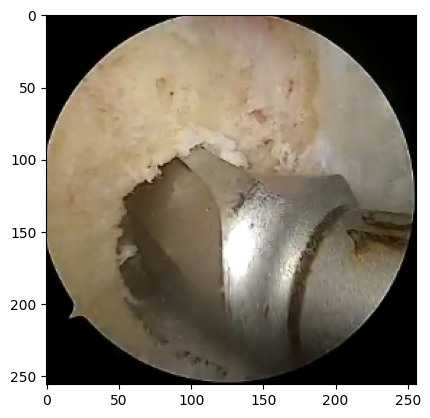

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Acorn reamer: [INST]  
Describe the shape of the image? Select from options
0.A tiny, rounded metallic apparatus with a textured outer layer
1.An object with a metal surface that has a textured or fluted pattern, shaped like a circle, is depicted in the image.
2.A small, round, and metallic object, possibly a tool or a part of a larger assembly, with a textured or fluted surface.
3.A small, round metal tool with a grooved or textured surface.
4.the metallic object with a textured surfaceIt is a small and round object with a fluted surface It i
5.A dual-purpose tool combining a piercing, rotating tip with a clamping mechanism
6.A multi-functional tool with a rotating drill bit and jaws for grasping.
7.A combination instrument with a sharp, pointed drill bit and a gripping mechanism.
8.It is important in arthoscopy to know how to use the appropriate tools.
9.A combined tool with a sharp, pointed drill bit and a grasping mechanism.
10.A compact, tubular device that may have a handle or gr

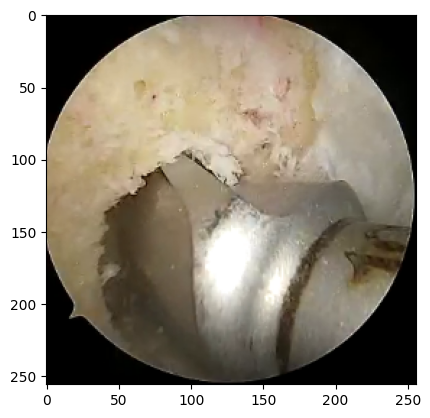

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Acorn reamer: [INST]  
Describe the shape of the image? Select from options
0.A small, round tool with a textured cutting edge.
1.A small, circular metal tool featuring a grooved or textured surface.
2.A diminutive, orb-shaped implement featuring a ridged surface
3.An object with a metal surface that has a textured or fluted pattern, shaped like a circle, is depicted in the image.
4.A small, metallic object with a textured or grooved spherical surface.
5.A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image.
6.A tool with a sharp, pointed drill bit and a pair of jaws for grasping.
7.A multi-purpose tool with a rotating drill bit and a clamping mechanism.
8.A combination tool which has to be chosen to be a part of the arthroscopic surgery to be performed.
9.A hybrid instrument featuring a penetrating, spinning point and a gripping apparatus
10.A slim, tube-like implement that may incorp

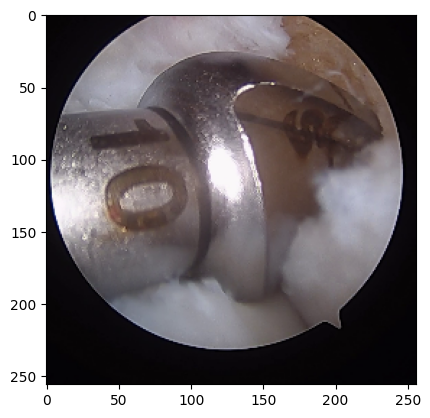

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Acorn reamer: [INST]  
Describe the shape of the image? Select from options
0.A small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic 
1.A compact, rounded metallic tool featuring a textured or grooved surface.
2.A diminutive, orb-shaped implement featuring a ridged surface
3.An object with a metallic finish and a textured or fluted surface, resembling a small bell or a decorative piece.
4.a tiny, round, and metallic object with a fluted or textured surface.
5.A tool that combines a pointed, rotating drill bit with a grasping mechanism featuring jaws.
6.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
7.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
8.A multi-purpose instrument that includes a sharp, rotating bit paired with a grasping mechanism featuring jaws.
9.A combination instrument with a sharp, pointed drill bit 

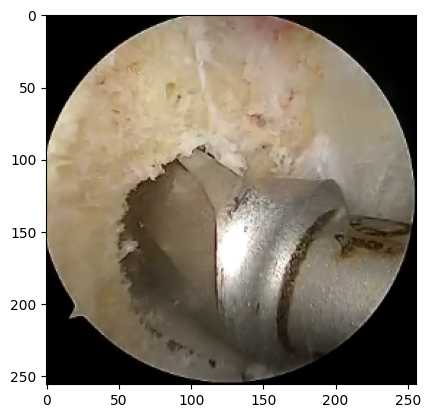

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Acorn reamer: [INST]  
Describe the shape of the image? Select from options
0.A tiny, circular, and metallic item with a textured or fluted surface.
1.A petite, globular metallic instrument with a corrugated skin
2.An object with a metallic finish and a textured or fluted surface, resembling a small bell or a decorative piece.
3.A small, circular metal tool featuring a grooved or textured surface.
4.A small, metallic object with a textured or grooved spherical surface.
5.In this situation the patient will be able to have more time with the doctor or the patient to talk 
6.A versatile implement merging a boring, twirling end with a clasping device
7.A dual-purpose instrument with a pointed drill bit and a grasping mechanism with jaws.
8.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
9.It is important in arthoscopy to know how to use the appropriate tools.
10.One-level, minimally invasive, minimally invasive, less invasive.
11.A slender, cylin

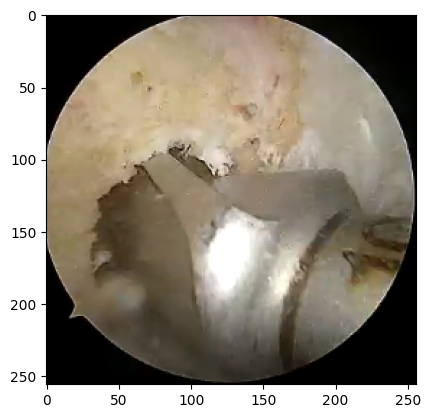

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Acorn reamer: [INST]  
Describe the shape of the image? Select from options
0.A small, round, and metallic object with a textured or fluted surfaceThe small, round, and metallic 
1.A small, round tool with a textured cutting edge.
2.A tiny, fluted metal instrument used for drilling.
3.a tiny, round, and metallic object with a fluted or textured surface.
4.A miniature reamer with a rounded shape.
5.A hybrid instrument featuring a penetrating, spinning point and a gripping apparatus
6.• In case of a large defect of the lateral condyle or the lateral part of the glenoid, an arthrodesi
7.In this situation the patient will be able to have more time with the doctor or the patient to talk 
8.A tool that combines a pointed, rotating drill bit with a grasping mechanism featuring jaws.
9.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
10.A compact, tubular device that may have a handle or grip on one end.
11.A slender, cylindrical object that could feature a g

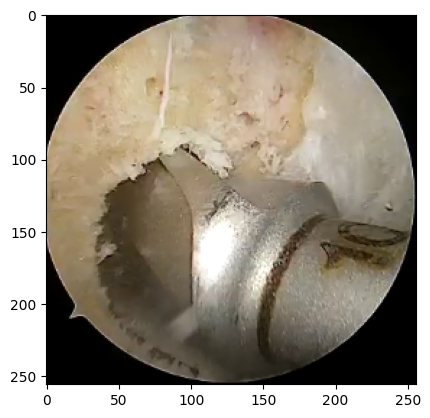

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Acorn reamer: [INST]  
Describe the shape of the image? Select from options
0.A diminutive, orb-shaped implement featuring a ridged surface
1.A tiny, fluted metal instrument used for drilling.
2.A small, ball-like metal device adorned with intricate patterns
3.A compact, spherical metal tool with a grooved exterior
4.A miniature reamer with a rounded shape.
5.A multi-purpose tool with a rotating drill bit and a clamping mechanism.
6.A multi-purpose instrument that includes a sharp, rotating bit paired with a grasping mechanism featuring jaws.
7.A hybrid instrument featuring a penetrating, spinning point and a gripping apparatus
8.• In case of a large defect of the lateral condyle or the lateral part of the glenoid, an arthrodesi
9.A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image.
10.A compact, rod-shaped tool with a potential control mechanism
11.A cylindrical instrument with a ro

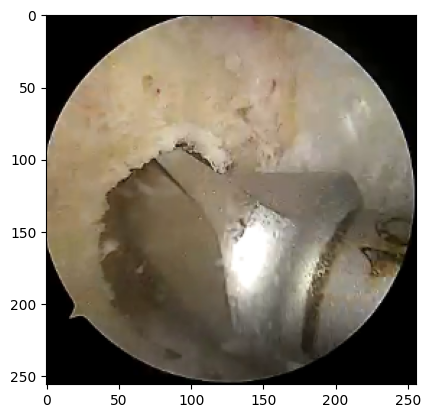

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Acorn reamer: [INST]  
Describe the shape of the image? Select from options
0.A compact, rounded metallic tool featuring a textured or grooved surface.
1.A tiny, circular, and metallic item with a textured or fluted surface.
2.A tiny, rounded metallic apparatus with a textured outer layer
3.An object with a metal surface that has a textured or fluted pattern, shaped like a circle, is depicted in the image.
4.A small, round, and metallic object, possibly a tool or a part of a larger assembly, with a textured or fluted surface.
5.A versatile instrument featuring a pointed, sharp bit and a gripping mechanism with jaws, designed for precision and control during a medical procedure.
6.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
7.A combination instrument with a sharp, pointed drill bit and a gripping mechanism.
8.A multi-functional tool with a rotating drill bit and jaws for grasping.
9.A versatile instrument compri

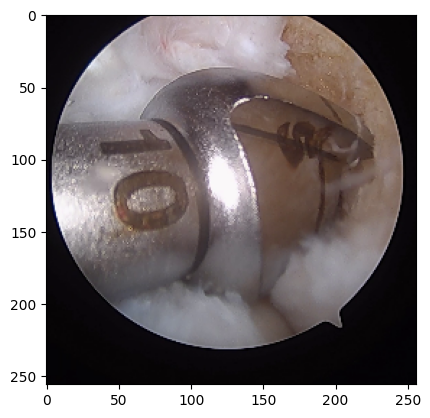

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Acorn reamer: [INST]  
Describe the shape of the image? Select from options
0.A miniature reamer with a rounded shape.
1.A diminutive, orb-shaped implement featuring a ridged surface
2.An object with a metallic finish and a textured or fluted surface, resembling a small bell or a decorative piece.
3.A small, metallic object with a textured or grooved spherical surface.
4.A compact, rounded metallic tool featuring a textured or grooved surface.
5.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
6.A combination tool which has to be chosen to be a part of the arthroscopic surgery to be performed.
7.A dual-purpose tool combining a piercing, rotating tip with a clamping mechanism
8.A tool with a sharp, pointed drill bit and a pair of jaws for grasping.
9.A multi-purpose instrument that includes a sharp, rotating bit paired with a grasping mechanism featuring jaws.
10.A sleek, tubular device, possibly equipped with a handle at one end.
11.A slender,

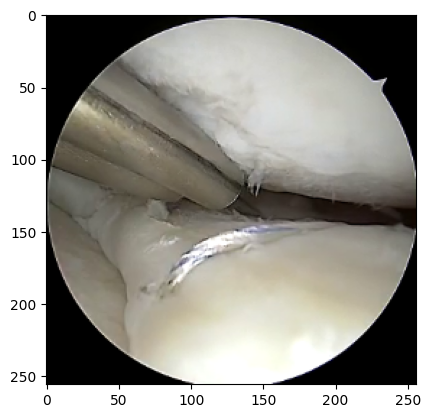

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.Somewhat more than you could imagine.
1.A tube-like object that is bent or curved, and may have measurements or markings on its exterior.
2.A curved or angled tube-like structure with markings.
3.curved tube-like structure with markings on its surface, potentially with markings or gradations on 
4.A curved or angled tube-like guide with possible surface markings or measurement indicators.
5.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
6.A thin, supple fiber, potentially appearing beefier from attached surgical string
7.A thin, thread-like device with a suture attached.
8.A delicate, pliable filament, potentially appearing robust due to attached surgical thread
9.A fine, flexible thread with an attached suture material, making it slightly thicker.
10.A narrow, cylindrical device, often featuring a handle at one end for 

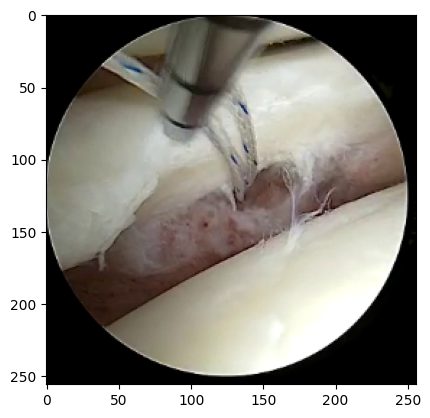

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.An arcuate or slanted pipe-like tool, possibly exhibiting scaled indicators
1.A tubular structure with an angled or curved design, possibly including surface markings for accuracy.
2.Somewhat more than you could imagine.
3.A curved or angled guide for repairing the inside of the meniscus.
4.A curved or angled hollow shaft, possibly displaying calibrated markings
5.a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material
6.A thin, flexible thread-like structure that is noticeably thicker due to the attached suture material.
7.A delicate, flexible fiber with a suture incorporated.
8.the "thin, flat, and thin" thread-like structure.
9.A thin, supple fiber, potentially appearing beefier from attached surgical string
10.A streamlined, cylindrical device, potentially equipped with a control interface
11.One-level, minimally invasive, minimally invasiv

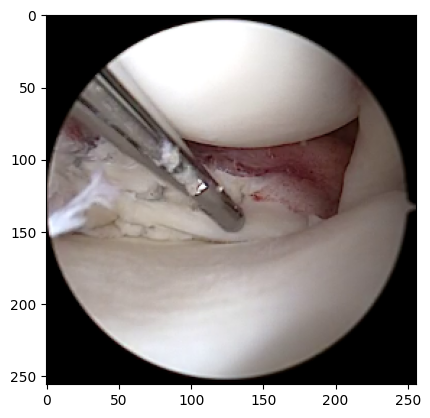

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.A curved or angled tube-like structure with markings.
1.Somewhat more than you could imagine.
2.An arcuate or slanted pipe-like tool, possibly exhibiting scaled indicators
3.An elongated, tube-like structure possibly featuring markings or measurements on its surface.
4.curved tube-like structure with markings on its surface, potentially with markings or gradations on 
5.a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material
6.A single-row, flexible thread-like structure.
7.A slender, malleable cord, perhaps looking stouter owing to connected stitching thread
8.A slender, bendable object with a suture attached, that might look a bit thicker because of the suture material.
9.thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du
10.A low-profile, tubular device, potentially with a handle mechanism on

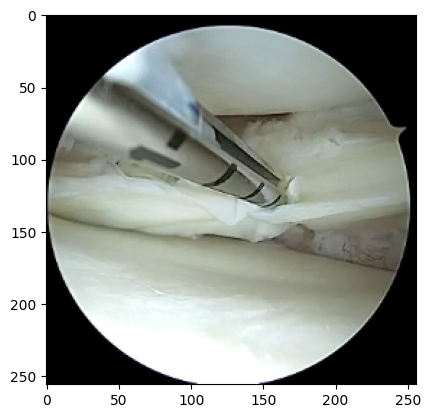

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.A tubular structure with a curved or angled design, potentially marked with graduations for guidance.
1.An arcuate or slanted pipe-like tool, possibly exhibiting scaled indicators
2.Somewhat more than you could imagine.
3.A tubular device with markings for guiding internal meniscus repair.
4.In this regard, the following article, the second on the subject, has been addressed by the authors.
5.A single-row, flexible thread-like structure.
6.A thin, flexible thread-like structure that is noticeably thicker due to the attached suture material.
7.A slender, flexible fiber with a suture material incorporated.
8.A thin, thread-like device with a suture attached.
9.A fine, flexible thread with an attached suture material, making it slightly thicker.
10.The authors declare that your response to the text is a sketch of what you should consider the follo
11.A long, tube-like instrument with a handl

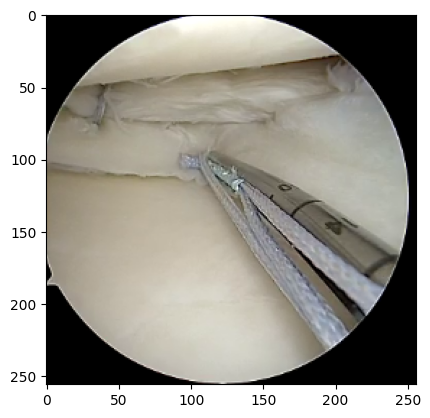

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.A curved or angled hollow shaft, possibly displaying calibrated markings
1.An arched or bent tubular structure, potentially featuring measurement indicators
2.A bowed or inclined cylindrical form, potentially bearing graduated notches
3.A curved or angled tube-like structure with markings.
4.A tubular structure with an angled or curved design, possibly including surface markings for accuracy.
5.A single-row, flexible thread-like structure.
6.the "thin, flat, and thin" thread-like structure.
7.A slender, malleable cord, perhaps looking stouter owing to connected stitching thread
8.A fine, flexible thread with an attached suture material, making it slightly thicker.
9.A flexible, thread-like structure, slightly thickened due to its suture material.
10.A sleek, cylindrical apparatus, possibly featuring a grip on one side.
11.A low-profile, tubular device, potentially with a handle mechanism 

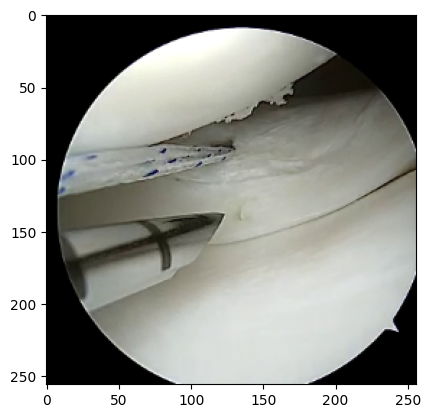

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.A curved or angled tube-like structure.
1.curved tube-like structure with markings on its surface, potentially with markings or gradations on 
2.In this regard, the following article, the second on the subject, has been addressed by the authors.
3.A tubular device with markings for guiding internal meniscus repair.
4.A tubular structure with a curved or angled design, potentially marked with graduations for guidance.
5.A thin, supple fiber, potentially appearing beefier from attached surgical string
6.A single-row, flexible thread-like structure.
7.The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance.
8.A slender, bendable object with a suture attached, that might look a bit thicker because of the suture material.
9.A thin, flexible thread-like structure with a suture attached.
10.A slim, tube-like i

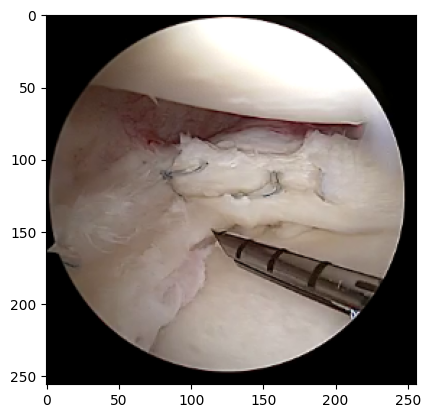

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.A tube-like structure with markings for guiding internal meniscus repair.
1.A bowed or inclined cylindrical form, potentially bearing graduated notches
2.A curved, tubular guide with possible markings or gradations for precision.
3.An elongated, tube-like structure possibly featuring markings or measurements on its surface.
4.A tube-like object that is bent or curved, and may have measurements or markings on its exterior.
5.A flexible, thread-like structure, slightly thickened due to its suture material.
6.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
7.A thin, thread-like device with a suture attached.
8.A delicate, pliable filament, potentially appearing robust due to attached surgical thread
9.A delicate, flexible fiber with a suture incorporated.
10.One-level, minimally invasive, minimally invasive, less invasive.
1

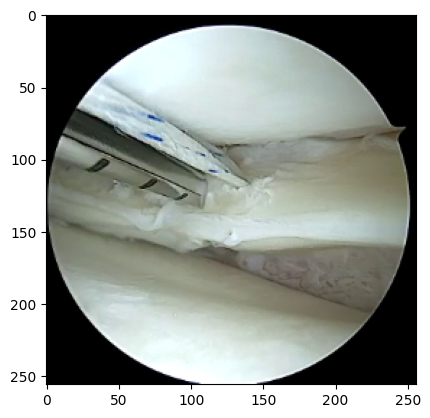

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.A curved or angled guide for internal meniscus surgery.
1.An arcuate or slanted pipe-like tool, possibly exhibiting scaled indicators
2.A bent or angled tube-like tool, possibly featuring surface markings or graduations.
3.A curved or angled guide for repairing the inside of the meniscus.
4.A tubular device with markings for guiding internal meniscus repair.
5.A fine, flexible thread with an attached suture material, making it slightly thicker.
6.A fine, bendable strand, possibly seeming more substantial with affixed suturing material
7.A slender, flexible fiber with a suture material incorporated.
8.A flexible, thread-like structure, slightly thickened due to its suture material.
9.A thin, supple fiber, potentially appearing beefier from attached surgical string
10.A compact, cylindrical instrument with a handle on one side.
11.A slender, tubular device, possibly having a handle or grip 

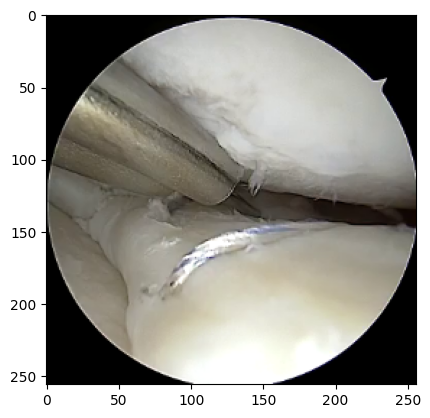

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.A tubular device with markings for guiding internal meniscus repair.
1.An arcuate or slanted pipe-like tool, possibly exhibiting scaled indicators
2.A curved metal rod with markings or gradations visible on its surface, An instrument with a tube-like shape, designed for use in a medical or surgical setting.
3.A curved or angled hollow shaft, possibly displaying calibrated markings
4.A tube that has a curved or angled shape, potentially featuring markings or gradations, A tube that has a curved or angled shape, potentially featuring markings or gradations.
5.A thin, pliable thread, potentially appearing thicker due to the attached suturing material.
6.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
7.A thin, flexible thread that appears slightly bulkier due to its attached suturing material.
8.thin threads, not necessarily appearing thic

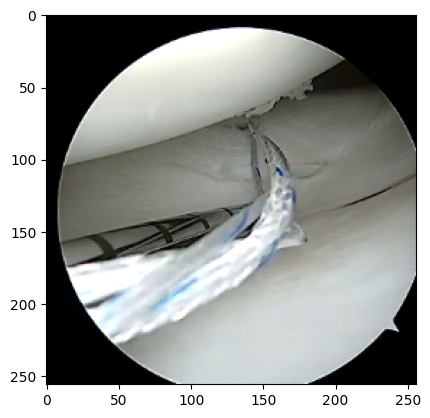

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.A tube-like structure with markings for guiding internal meniscus repair.
1.A curved or angled guide for internal meniscus surgery.
2.A curved or angled tube-like guide with possible surface markings or measurement indicators.
3.A curved or angled guide for repairing the inside of the meniscus.
4.curved tube-like structure with markings on its surface, potentially with markings or gradations on 
5.A wispy, adaptable line, possibly seeming thicker due to bonded suture material
6.A thin, flexible thread that appears slightly bulkier due to its attached suturing material.
7.A fine, bendable strand, possibly seeming more substantial with affixed suturing material
8.A thin, thread-like device with a suture attached.
9.The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance.
10.A sleek, tubular device, possib

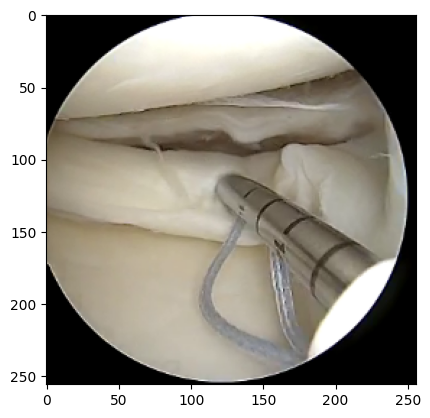

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


All inside meniscus repair device: [INST]  
Describe the shape of the image? Select from options
0.A tube-like structure with markings for guiding internal meniscus repair.
1.A curved or angled hollow shaft, possibly displaying calibrated markings
2.A tube-like object that is bent or curved, and may have measurements or markings on its exterior.
3.In this regard, the following article, the second on the subject, has been addressed by the authors.
4.An arched or bent tubular structure, potentially featuring measurement indicators
5.A fine, flexible thread with an attached suture material, making it slightly thicker.
6.A flexible, thread-like structure, slightly thickened due to its suture material.
7.A single-row, flexible thread-like structure.
8.A thin, flexible thread-like structure with a suture attached.
9.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
10.A low-profile, tubular tool with a handle mechanism.
11.A low-profile, tub

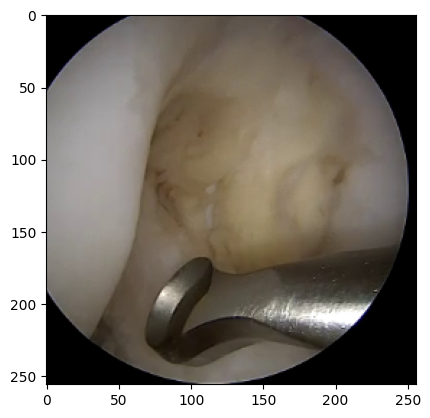

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Curette: [INST]  
Describe the shape of the image? Select from options
0.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
1.A tool that combines a pointed, rotating drill bit with a grasping mechanism featuring jaws.
2.A versatile implement merging a boring, twirling end with a clasping device
3.A composite instrument integrating a drilling component with a holding apparatus
4.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
5.A slender, extended tool with a miniature spoon-like or circular tip
6.An elongated instrument with a small, curved or looped end for scraping.
7.A slender object with a curved or hooked tip and a hollow center.
8.A slim, extended tool with a scooped or loop-shaped tip.
9.A slender, curved tool with a small, rounded or hooked tip.
10.A flexible, thread-like structure, slightly thickened due to its suture material.
11.a very thick or a very thin suture material.RESPONSE: a very thin or a

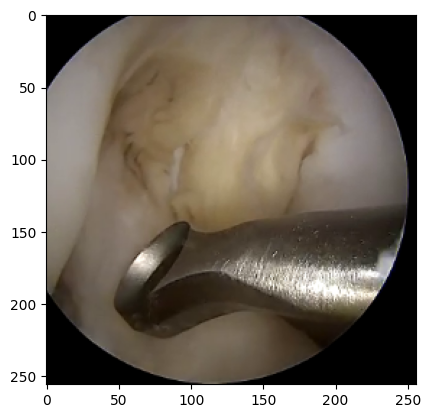

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Curette: [INST]  
Describe the shape of the image? Select from options
0.A combined tool with a sharp, pointed drill bit and a grasping mechanism.
1.In this situation the patient will be able to have more time with the doctor or the patient to talk 
2.• In case of a large defect of the lateral condyle or the lateral part of the glenoid, an arthrodesi
3.A combination instrument with a sharp, pointed drill bit and a gripping mechanism.
4.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
5.A long, thin instrument terminating in a diminutive scoop or loop
6.A narrow, cylindrical tool with a curved or hooked tip.
7.A small, looped or scooped-end instrument of thin, elongated shape.
8.An elongated, narrow implement featuring a tiny curved or ring-shaped end
9.A thin, curved instrument with a looped end.
10.A thin, flexible rod-like object with a suture material attached, which may appear slightly thicker.
11.a thin fibrous structure, potenti

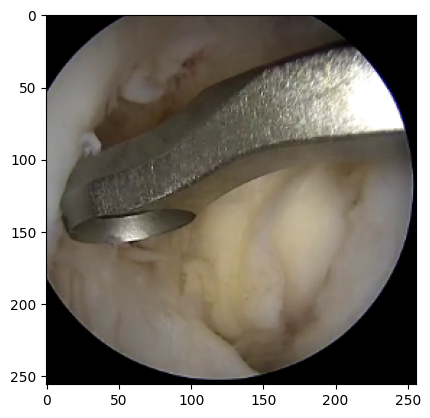

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Curette: [INST]  
Describe the shape of the image? Select from options
0.A surgical instrument with a sharp, pointed tip and a grasping mechanism with jaws, designed for medical procedures.
1.A combined tool with a sharp, pointed drill bit and a grasping mechanism.
2.A combination tool which has to be chosen to be a part of the arthroscopic surgery to be performed.
3.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
4.A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image.
5.The use of an osteotome or a mini-osteotome should be reserved to surgeons who have a good surgical 
6.A thin, elongated tool with a scooped end.
7.A long, thin instrument terminating in a diminutive scoop or loop
8.A slender, curved tool with a small, rounded or hooked tip.
9.A slender, tube-like tool with a small, scooped or looped tip.
10.A fine, flexible thread with an attached 

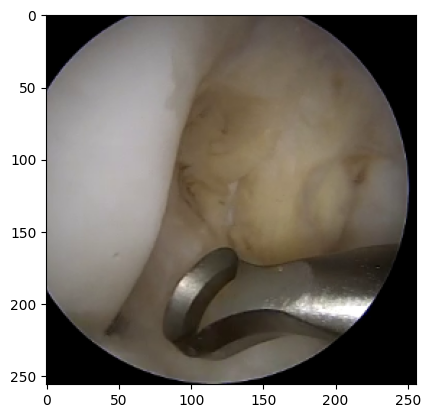

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Curette: [INST]  
Describe the shape of the image? Select from options
0.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
1.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
2.A multi-functional tool with a rotating drill bit and jaws for grasping.
3.A multi-purpose instrument that includes a sharp, rotating bit paired with a grasping mechanism featuring jaws.
4.A combination instrument with a sharp, pointed drill bit and a gripping mechanism.
5.A slender object with a curved or hooked tip and a hollow center.
6.The use of an osteotome or a mini-osteotome should be reserved to surgeons who have a good surgical 
7.The most frequently performed surgical treatment of the degenerative meniscus disease is a meniscoto
8.A long, thin instrument terminating in a diminutive scoop or loop
9.We have made use of various instruments for arthoscopy: arthroscope, arthroscope combined with an en
10.A slender,

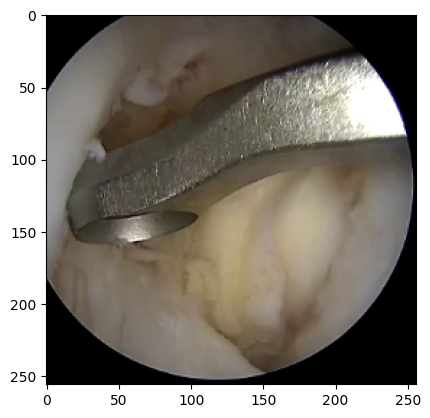

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Curette: [INST]  
Describe the shape of the image? Select from options
0.A multi-functional tool with a rotating drill bit and jaws for grasping.
1.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
2.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
3.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
4.A dual-purpose instrument with a pointed drill bit and a grasping mechanism with jaws.
5.The use of an osteotome or a mini-osteotome should be reserved to surgeons who have a good surgical 
6.An attenuated, fine implement capped with a small bowl-shaped or looped tip
7.A thin, elongated instrument with a scooped or looped end for precision.
8.A slender, elongated tool for scraping or scooping.
9.An elongated, narrow implement featuring a tiny curved or ring-shaped end
10.thin threads, not necessarily appearing thick and therefore possibly appe

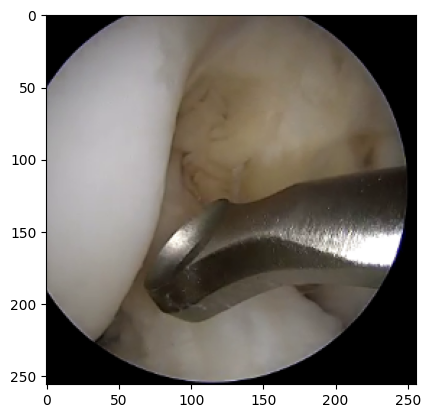

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Curette: [INST]  
Describe the shape of the image? Select from options
0.In this situation the patient will be able to have more time with the doctor or the patient to talk 
1.A surgical instrument with a sharp, pointed tip and a grasping mechanism with jaws, designed for medical procedures.
2.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
3.A multi-purpose tool with a rotating drill bit and a clamping mechanism.
4.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
5.A slender, curved tool with a small, rounded or hooked tip.
6.An attenuated, fine implement capped with a small bowl-shaped or looped tip
7.A long, thin instrument with a looped or scooped end designed for scraping.
8.A narrow, cylindrical tool with a curved or hooked tip.
9.A slim, stretched tool with a petite concave or circular extremity
10.The image shows a thin, flexible thread-like structure that has been

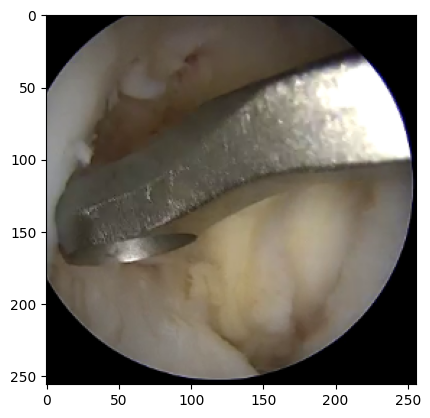

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Curette: [INST]  
Describe the shape of the image? Select from options
0.A tool with a sharp, pointed drill bit and a pair of jaws for grasping.
1.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
2.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
3.A multi-functional tool with a rotating drill bit and jaws for grasping.
4.• In case of a large defect of the lateral condyle or the lateral part of the glenoid, an arthrodesi
5.An elongated instrument with a small, curved or looped end for scraping.
6.A small, looped or scooped-end instrument of thin, elongated shape.
7.A slim, stretched tool with a petite concave or circular extremity
8.A slender, curved tool with a small, rounded or hooked tip.
9.An attenuated, fine implement capped with a small bowl-shaped or looped tip
10.A thin, flexible thread-like structure with a suture attached.
11.A thin, pliable thread, potentially appearing 

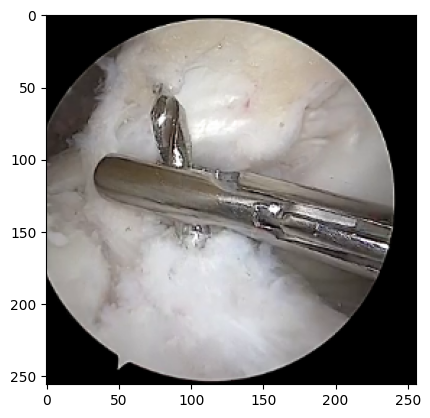

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Drill bit and grasper: [INST]  
Describe the shape of the image? Select from options
0.A bent or tilted tubular implement, potentially showing measurement gradations
1.A tube that has a curved or angled shape, potentially featuring markings or gradations, A tube that has a curved or angled shape, potentially featuring markings or gradations.
2.In addition to the above, you will also refer to the following text which is an example of an artist
3.An elongated, tube-like structure possibly featuring markings or measurements on its surface.
4.A tube-like object that is bent or curved, and may have measurements or markings on its exterior.
5.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
6.It is important in arthoscopy to know how to use the appropriate tools.
7.A combined tool with a sharp, pointed drill bit and a grasping mechanism.
8.In this situation the patient will be able to have more time with the doctor or the patient to talk 
9.A combin

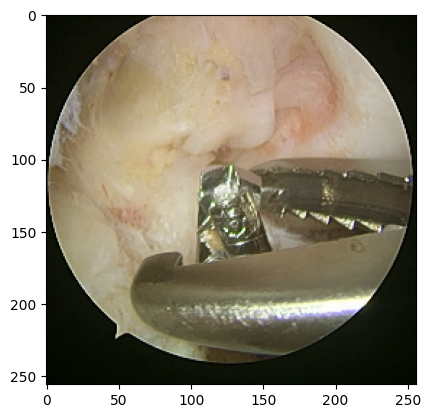

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Drill bit and grasper: [INST]  
Describe the shape of the image? Select from options
0.A tube-like structure with markings for guiding internal meniscus repair.
1.An arched or bent tubular structure, potentially featuring measurement indicators
2.A bowed or inclined cylindrical form, potentially bearing graduated notches
3.A curved or angled tube-like guide with possible surface markings or measurement indicators.
4.In addition to the above, you will also refer to the following text which is an example of an artist
5.A versatile instrument featuring a pointed, sharp bit and a gripping mechanism with jaws, designed for precision and control during a medical procedure.
6.• In case of a large defect of the lateral condyle or the lateral part of the glenoid, an arthrodesi
7.A multi-functional tool with a rotating drill bit and jaws for grasping.
8.A dual-purpose instrument with a pointed drill bit and a grasping mechanism with jaws.
9.In this situation the patient will be able to have more

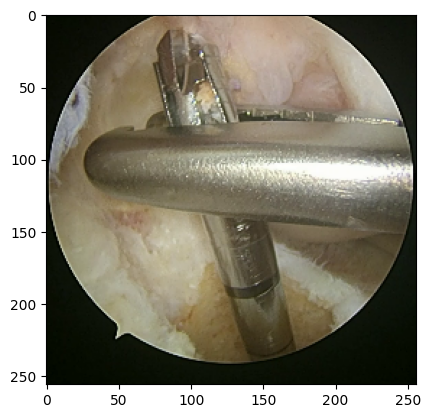

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Drill bit and grasper: [INST]  
Describe the shape of the image? Select from options
0.A curved or angled tube-like guide with possible surface markings or measurement indicators.
1.In this regard, the following article, the second on the subject, has been addressed by the authors.
2.In addition to the above, you will also refer to the following text which is an example of an artist
3.A tubular structure with an angled or curved design, possibly including surface markings for accuracy.
4.A tube-like object that is bent or curved, and may have measurements or markings on its exterior.
5.A versatile instrument featuring a pointed, sharp bit and a gripping mechanism with jaws, designed for precision and control during a medical procedure.
6.A multi-purpose instrument that includes a sharp, rotating bit paired with a grasping mechanism featuring jaws.
7.A combination instrument with a sharp, pointed drill bit and a gripping mechanism.
8.It is important in arthoscopy to know how to use the 

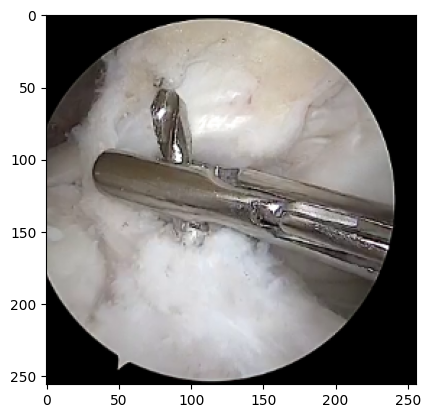

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Drill bit and grasper: [INST]  
Describe the shape of the image? Select from options
0.A tubular structure with a curved or angled design, potentially marked with graduations for guidance.
1.A curved or angled tube-like structure.
2.An elongated, tubular object with possibly marked or graduated sides, set against a darker background.
3.A tube-like structure with markings for guiding internal meniscus repair.
4.A curved or angled tube-like guide with possible surface markings or measurement indicators.
5.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
6.A combined tool with a sharp, pointed drill bit and a grasping mechanism.
7.A multi-functional tool with a rotating drill bit and jaws for grasping.
8.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
9.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
10.A fine, bendable strand, possibly se

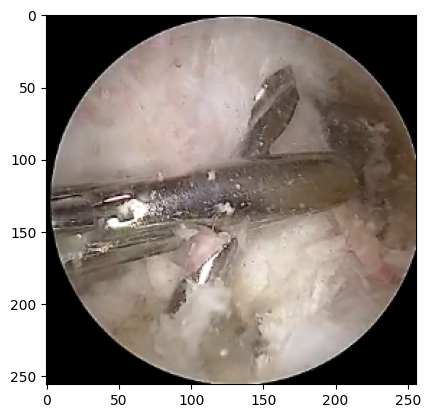

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Drill bit and grasper: [INST]  
Describe the shape of the image? Select from options
0.A curved metal rod with markings or gradations visible on its surface, An instrument with a tube-like shape, designed for use in a medical or surgical setting.
1.A curved, tubular guide with possible markings or gradations for precision.
2.A tube that has a curved or angled shape, potentially featuring markings or gradations, A tube that has a curved or angled shape, potentially featuring markings or gradations.
3.A curved or angled tube-like structure with markings.
4.A tubular device with markings for guiding internal meniscus repair.
5.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
6.A hybrid instrument featuring a penetrating, spinning point and a gripping apparatus
7.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
8.A tool that combines a pointed, rotating drill bit with a grasping mechanism featuring jaws.

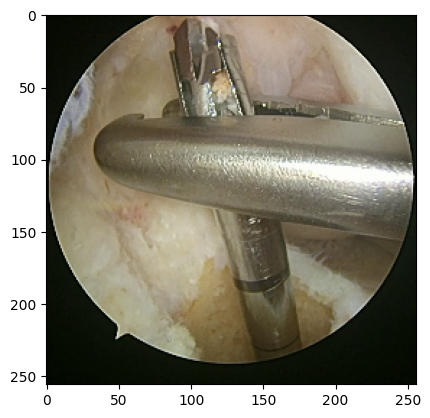

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Drill bit and grasper: [INST]  
Describe the shape of the image? Select from options
0.A tubular structure with a curved or angled design, potentially marked with graduations for guidance.
1.A curved metal rod with markings or gradations visible on its surface, An instrument with a tube-like shape, designed for use in a medical or surgical setting.
2.A tube-like structure with markings for guiding internal meniscus repair.
3.A tube-like object that is bent or curved, and may have measurements or markings on its exterior.
4.In this regard, the following article, the second on the subject, has been addressed by the authors.
5.A multi-functional tool with a rotating drill bit and jaws for grasping.
6.A hybrid instrument featuring a penetrating, spinning point and a gripping apparatus
7.A tool that combines a pointed, rotating drill bit with a grasping mechanism featuring jaws.
8.A surgical instrument with a sharp, pointed tip and a grasping mechanism with jaws, designed for medical proced

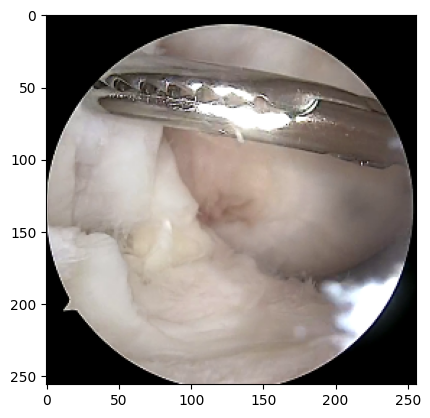

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
1.A wispy, adaptable line, possibly seeming thicker due to bonded suture material
2.A thin, supple fiber, potentially appearing beefier from attached surgical string
3.A flexible, thread-like structure, slightly thickened due to its suture material.
4.A delicate, flexible fiber with a suture incorporated.
5.A long, tube-like instrument with a handle on one side.
6.A cylindrical instrument with a rounded end, possibly equipped with a handle for manipulation.
7.A compact, rod-shaped tool with a potential control mechanism
8.A low-profile, tubular device with a handle for easy use.
9.A narrow, cylindrical device, often featuring a handle at one end for operation.
10.A versatile instrument featuring a pointed, sharp bit and a gripping mechanism with jaws, designed for precision and control during a medic

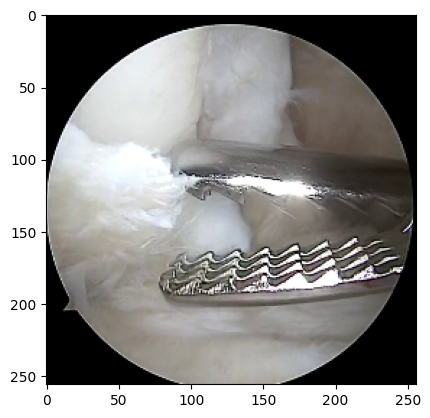

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.the "thin, flat, and thin" thread-like structure.
1.thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du
2.A flexible, thread-like structure, slightly thickened due to its suture material.
3.A thin, flexible thread that appears slightly bulkier due to its attached suturing material.
4.A fine, bendable strand, possibly seeming more substantial with affixed suturing material
5.A low-profile, tubular device, potentially with a handle mechanism on the other endósty.When searchi
6.A small, cylindrical device for repairing the inside of the meniscus.
7.A slim, tube-like implement that may incorporate a handling system
8.A low-profile, tubular tool with a handle mechanism.
9.A slender, cylindrical object that could feature a grip on one side.
10.A versatile instrument comprising a pointed, sharp bit, which may rotate, and a grasping device with jaws for a secure hold.
11.A 

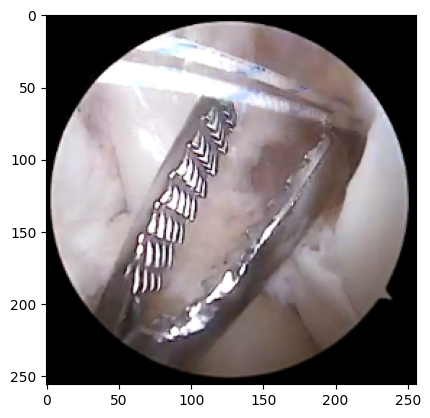

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.A fine, flexible thread, which may appear slightly thicker due to its attached suture material.
1.A flexible, thread-like structure, slightly thickened due to its suture material.
2.thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du
3.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
4.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
5.A narrow, cylindrical device, often featuring a handle at one end for operation.
6.A cylindrical instrument with a rounded end, possibly equipped with a handle for manipulation.
7.A sleek, cylindrical apparatus, possibly featuring a grip on one side.
8.A small, cylindrical device for repairing the inside of the meniscus.
9.What is the current status of the use of the RESPONSE?
10.A multi-purpose tool with a rotating d

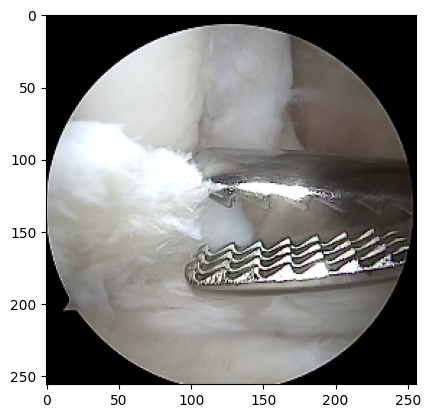

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du
1.A thin, flexible thread that appears slightly bulkier due to its attached suturing material.
2.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
3.A single-row, flexible thread-like structure.
4.A fine, flexible thread with an attached suture material, making it slightly thicker.
5.A slender, cylindrical device for internal meniscus surgery.
6.A sleek, cylindrical apparatus, possibly featuring a grip on one side.
7.A low-profile, tubular device with a handle for easy use.
8.What is the current status of the use of the RESPONSE?
9.A slim, tube-like implement that may incorporate a handling system
10.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
11.A tool that combines a pointed, rotating drill bit with a grasp

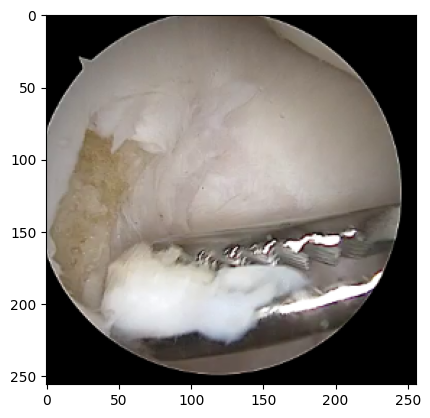

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.A thin, thread-like device with a suture attached.
1.a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material
2.A wispy, adaptable line, possibly seeming thicker due to bonded suture material
3.A fine, flexible thread with an attached suture material, making it slightly thicker.
4.thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du
5.A slender, cylindrical instrument, possibly featuring an operational end
6.A sleek, tubular device, possibly equipped with a handle at one end.
7.A slender, cylindrical object that could feature a grip on one side.
8.A slender, tubular device, possibly having a handle or grip on one end.
9.A slender, cylindrical device for internal meniscus surgery.
10.A tool with a sharp, pointed drill bit and a pair of jaws for grasping.
11.A versatile implement merging a boring, twirling end with a clasping

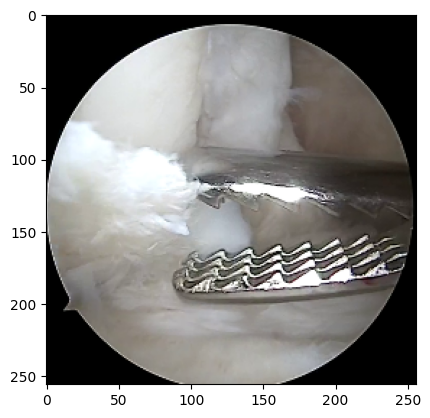

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.A wispy, adaptable line, possibly seeming thicker due to bonded suture material
1.A thin, flexible thread that appears slightly bulkier due to its attached suturing material.
2.The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance.
3.A fine, flexible thread with an attached suture material, making it slightly thicker.
4.a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material
5.A small, cylindrical device for repairing the inside of the meniscus.
6.A streamlined, cylindrical device, potentially equipped with a control interface
7.A slender, cylindrical instrument, possibly featuring an operational end
8.A compact, tubular device, possibly with a handle at one end for control.
9.A sleek, cylindrical apparatus, possibly featuring a grip on one side.
10.In this situation the patient wil

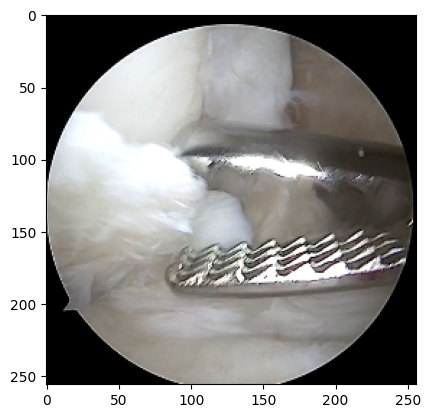

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
1.A flexible, thread-like structure, slightly thickened due to its suture material.
2.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
3.A single-row, flexible thread-like structure.
4.the "thin, flat, and thin" thread-like structure.
5.A cylindrical instrument with a rounded end, possibly equipped with a handle for manipulation.
6.A slim, tube-like implement that may incorporate a handling system
7.A small, cylindrical device for repairing the inside of the meniscus.
8.What is the current status of the use of the RESPONSE?
9.A slender, tubular instrument for internal meniscus repair.
10.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
11.A multi-purpose instrument that includes a sharp, rotating bit paire

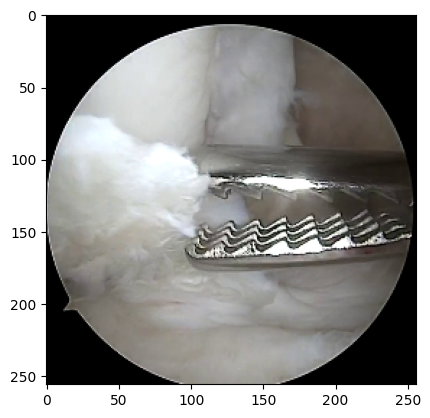

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
1.A thin, flexible thread that appears slightly bulkier due to its attached suturing material.
2.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
3.A thin, supple fiber, potentially appearing beefier from attached surgical string
4.A single-row, flexible thread-like structure.
5.A streamlined, cylindrical device, potentially equipped with a control interface
6.A slender, cylindrical device for internal meniscus surgery.
7.A cylindrical instrument with a rounded end, possibly equipped with a handle for manipulation.
8.A slender, cylindrical instrument, possibly featuring an operational end
9.A low-profile, tubular device, potentially with a handle mechanism on the other endósty.When searchi
10.We have used a sharp and pointed tool in the combination 

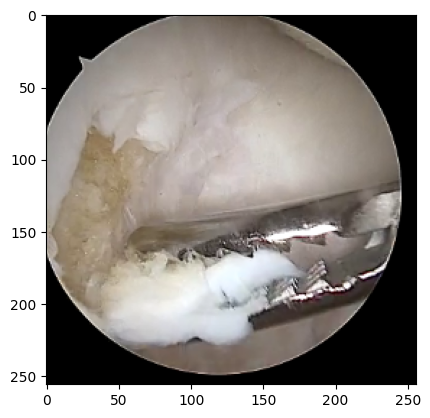

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance.
1.A thin, thread-like device with a suture attached.
2.A slender, flexible fiber with a suture material incorporated.
3.A single-row, flexible thread-like structure.
4.A thin, flexible thread-like structure with a suture attached.
5.A slender, tubular device, possibly having a handle or grip on one end.
6.A slender, tubular instrument for internal meniscus repair.
7.A narrow, elongated apparatus, perhaps including a manipulative component
8.A low-profile, tubular device with a handle for easy use.
9.A narrow, cylindrical device, often featuring a handle at one end for operation.
10.A combination tool which has to be chosen to be a part of the arthroscopic surgery to be performed.
11.It is important in arthoscopy to know how to use the appropriate tools.
12.A multi-function

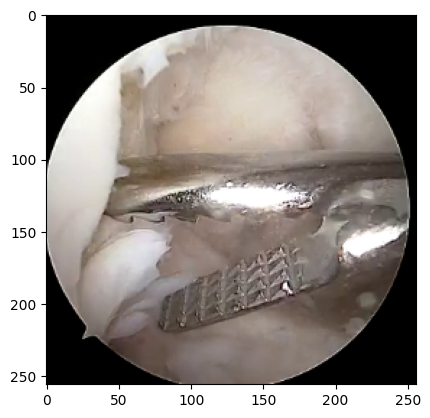

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material
1.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
2.thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du
3.A slender, bendable object with a suture attached, that might look a bit thicker because of the suture material.
4.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
5.A streamlined, cylindrical device, potentially equipped with a control interface
6.A compact, tubular device, possibly with a handle at one end for control.
7.A slim, tube-like implement that may incorporate a handling system
8.A compact, cylindrical instrument with a handle on one side.
9.A small, cylindrical device for repairing the inside of the meniscus.
10.A combination tool wh

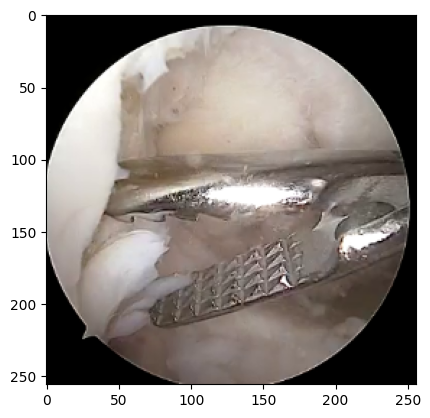

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
1.A thin, flexible thread that appears slightly bulkier due to its attached suturing material.
2.A single-row, flexible thread-like structure.
3.A thin, pliable thread, potentially appearing thicker due to the attached suturing material.
4.A delicate, flexible fiber with a suture incorporated.
5.A sleek, tubular device, possibly equipped with a handle at one end.
6.A slender, tubular device, possibly having a handle or grip on one end.
7.A streamlined, cylindrical device, potentially equipped with a control interface
8.A low-profile, tubular tool with a handle mechanism.
9.One-level, minimally invasive, minimally invasive, less invasive.
10.A dual-purpose instrument with a pointed drill bit and a grasping mechanism with jaws.
11.A versatile instrument comprising a pointed, sharp bit, which may rotate

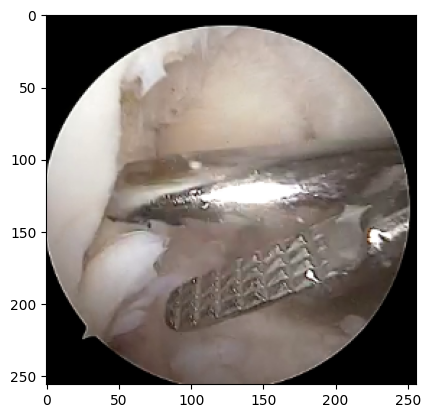

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.A thin, flexible thread-like structure with a suture attached.
1.A thin, flexible thread that appears slightly bulkier due to its attached suturing material.
2.A fine, flexible thread with an attached suture material, making it slightly thicker.
3.A delicate, pliable filament, potentially appearing robust due to attached surgical thread
4.A thin, flexible thread-like structure that is noticeably thicker due to the attached suture material.
5.A compact, cylindrical instrument with a handle on one side.
6.A cylindrical instrument with a rounded end, possibly equipped with a handle for manipulation.
7.What is the current status of the use of the RESPONSE?
8.A narrow, elongated apparatus, perhaps including a manipulative component
9.A streamlined, cylindrical device, potentially equipped with a control interface
10.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
11.A versat

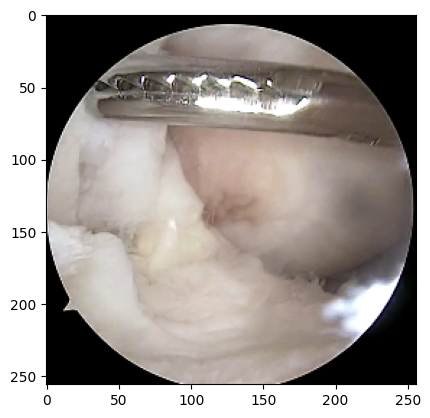

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.A wispy, adaptable line, possibly seeming thicker due to bonded suture material
1.A fine, flexible thread with an attached suture material, making it slightly thicker.
2.a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material
3.A slender, malleable cord, perhaps looking stouter owing to connected stitching thread
4.A fine, bendable strand, possibly seeming more substantial with affixed suturing material
5.A low-profile, tubular device, potentially with a handle mechanism on the other endósty.When searchi
6.A narrow, elongated apparatus, perhaps including a manipulative component
7.A slender, tubular device, possibly having a handle or grip on one end.
8.We can say that this system was not designed for use in the hands of an individual, and therefore no
9.A compact, tubular device that may have a handle or grip on one end.
10.A hybrid instrument featuring a penetrating, 

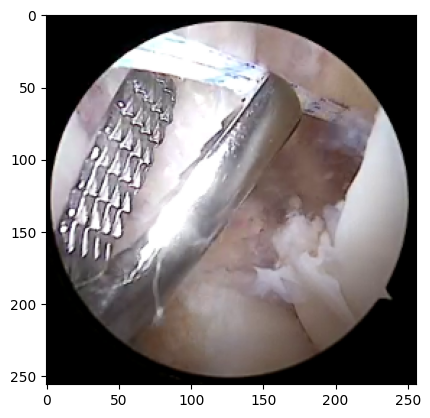

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.A thin, flexible thread that appears slightly bulkier due to its attached suturing material.
1.the "thin, flat, and thin" thread-like structure.
2.a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material
3.thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du
4.A slender, malleable cord, perhaps looking stouter owing to connected stitching thread
5.A slender, tubular device, possibly having a handle or grip on one end.
6.A cylindrical instrument with a rounded end, possibly equipped with a handle for manipulation.
7.A slender, cylindrical object that could feature a grip on one side.
8.A slender, tubular instrument for internal meniscus repair.
9.A slim, tube-like implement that may incorporate a handling system
10.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
11.A surgical inst

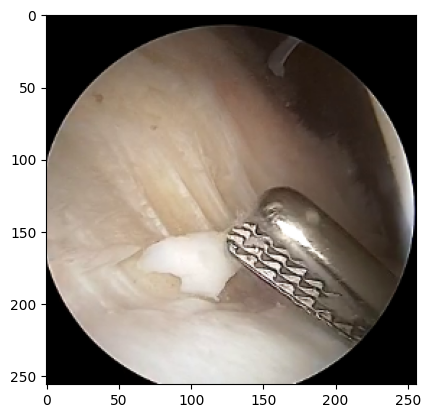

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Forceps: [INST]  
Describe the shape of the image? Select from options
0.A slender, bendable object with a suture attached, that might look a bit thicker because of the suture material.
1.A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material.
2.A slender, flexible fiber with a suture material incorporated.
3.A fine, bendable strand, possibly seeming more substantial with affixed suturing material
4.A delicate, pliable filament, potentially appearing robust due to attached surgical thread
5.What is the current status of the use of the RESPONSE?
6.A compact, rod-shaped tool with a potential control mechanism
7.A low-profile, tubular tool with a handle mechanism.
8.A narrow, elongated apparatus, perhaps including a manipulative component
9.A compact, cylindrical instrument with a handle on one side.
10.A dual-purpose instrument with a pointed drill bit and a grasping mechanism with jaws.
11.A multi-purpose instrument that includ

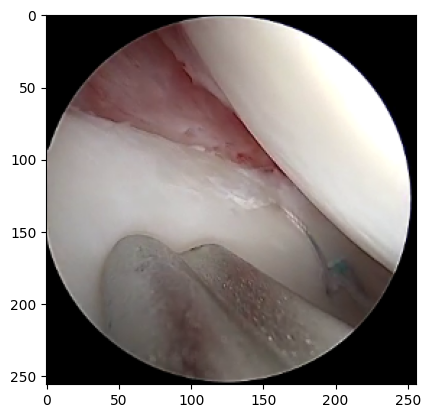

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Inside Out Meniscal Repair Guide: [INST]  
Describe the shape of the image? Select from options
0.A tool with a sharp, pointed drill bit and a pair of jaws for grasping.
1.It is important in arthoscopy to know how to use the appropriate tools.
2.A tool that combines a pointed, rotating drill bit with a grasping mechanism featuring jaws.
3.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
4.In this situation the patient will be able to have more time with the doctor or the patient to talk 
5.A narrow, elongated apparatus, perhaps including a manipulative component
6.A compact, tubular device that may have a handle or grip on one end.
7.A slender, tubular device, possibly having a handle or grip on one end.
8.A streamlined, cylindrical device, potentially equipped with a control interface
9.A compact, rod-shaped tool with a potential control mechanism
10.In addition to the above, you will also refer to the following text which is an example of an

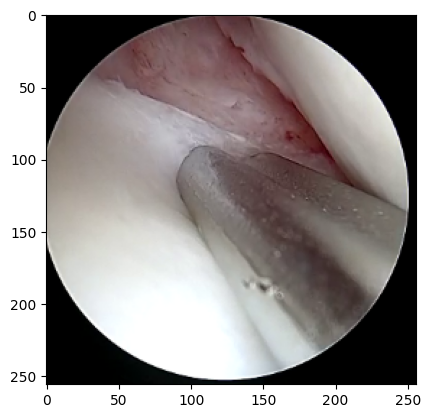

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Inside Out Meniscal Repair Guide: [INST]  
Describe the shape of the image? Select from options
0.In this situation the patient will be able to have more time with the doctor or the patient to talk 
1.A versatile implement merging a boring, twirling end with a clasping device
2.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
3.A multi-functional tool with a rotating drill bit and jaws for grasping.
4.A multi-purpose tool with a rotating drill bit and a clamping mechanism.
5.A small, cylindrical device for repairing the inside of the meniscus.
6.A sleek, tubular device, possibly equipped with a handle at one end.
7.A narrow, elongated apparatus, perhaps including a manipulative component
8.A low-profile, tubular device with a handle for easy use.
9.A slender, cylindrical instrument, possibly featuring an operational end
10.A bent or angled tube-like tool, possibly featuring surface markings or graduations.
11.A curved or angled tube-like structure wit

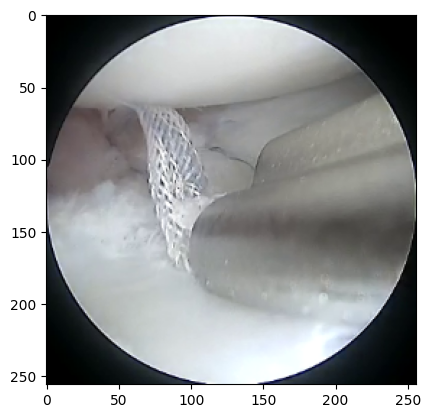

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Inside Out Meniscal Repair Guide: [INST]  
Describe the shape of the image? Select from options
0.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
1.A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image.
2.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
3.A tool that combines a pointed, rotating drill bit with a grasping mechanism featuring jaws.
4.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
5.A slim, tube-like implement that may incorporate a handling system
6.We can say that this system was not designed for use in the hands of an individual, and therefore no
7.A narrow, cylindrical device, often featuring a handle at one end for operation.
8.One-level, minimally invasive, minimally invasive, less invasive.
9.A slender, cylindrical object tha

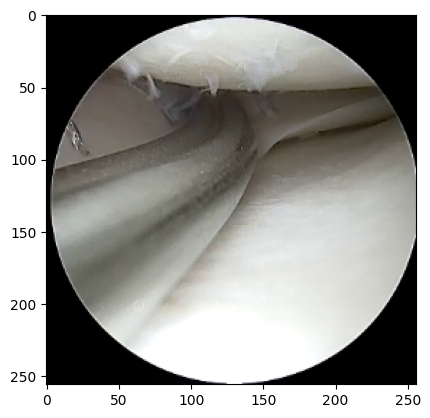

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Inside Out Meniscal Repair Guide: [INST]  
Describe the shape of the image? Select from options
0.A hybrid instrument featuring a penetrating, spinning point and a gripping apparatus
1.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
2.A versatile instrument comprising a pointed, sharp bit, which may rotate, and a grasping device with jaws for a secure hold.
3.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
4.A composite instrument integrating a drilling component with a holding apparatus
5.A long, tube-like instrument with a handle on one side.
6.We can say that this system was not designed for use in the hands of an individual, and therefore no
7.A low-profile, tubular device with a handle for easy use.
8.A slender, tubular device, possibly having a handle or grip on one end.
9.A slender, cylindrical instrument, possibly featuring an operational end
10.A curved or angle

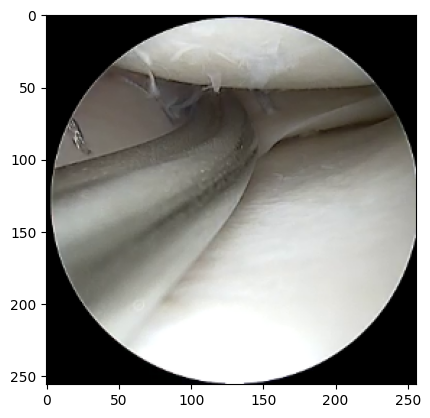

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Inside Out Meniscal Repair Guide: [INST]  
Describe the shape of the image? Select from options
0.A combined tool with a sharp, pointed drill bit and a grasping mechanism.
1.• In case of a large defect of the lateral condyle or the lateral part of the glenoid, an arthrodesi
2.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
3.A multi-purpose tool with a rotating drill bit and a clamping mechanism.
4.A dual-purpose tool combining a piercing, rotating tip with a clamping mechanism
5.A low-profile, tubular tool with a handle mechanism.
6.What is the current status of the use of the RESPONSE?
7.A sleek, cylindrical apparatus, possibly featuring a grip on one side.
8.A compact, tubular device that may have a handle or grip on one end.
9.A streamlined, cylindrical device, potentially equipped with a control interface
10.A curved or angled tube-like guide with possible surface markings or measurement indicators.
11.An elongated, tubular object with 

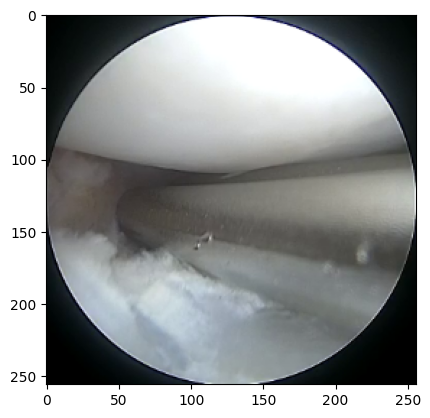

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Inside Out Meniscal Repair Guide: [INST]  
Describe the shape of the image? Select from options
0.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
1.• In case of a large defect of the lateral condyle or the lateral part of the glenoid, an arthrodesi
2.A versatile implement merging a boring, twirling end with a clasping device
3.It is important in arthoscopy to know how to use the appropriate tools.
4.A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image.
5.A low-profile, tubular tool with a handle mechanism.
6.The authors declare that your response to the text is a sketch of what you should consider the follo
7.A cylindrical instrument with a rounded end, possibly equipped with a handle for manipulation.
8.A slender, tubular instrument for internal meniscus repair.
9.We can say that this system was not designed for use in the hands of an indi

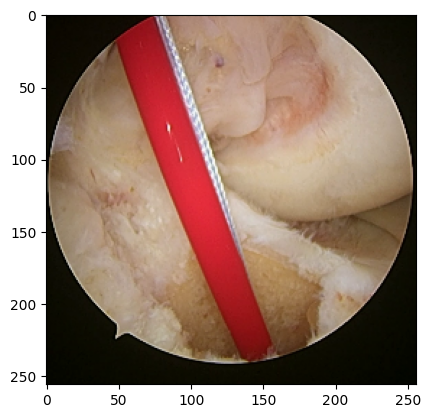

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Fiberstick suture: [INST]  
Describe the shape of the image? Select from options
0.A curved or angled tube-like guide with possible surface markings or measurement indicators.
1.A curved or angled tube-like structure.
2.A curved or angled guide for internal meniscus surgery.
3.A tube-like object that is bent or curved, and may have measurements or markings on its exterior.
4.A curved or angled tube-like structure with markings.
5.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
6.A multi-purpose instrument that includes a sharp, rotating bit paired with a grasping mechanism featuring jaws.
7.A versatile implement merging a boring, twirling end with a clasping device
8.A composite instrument integrating a drilling component with a holding apparatus
9.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
10.We can say that this system was not designed for use in the hands of an in

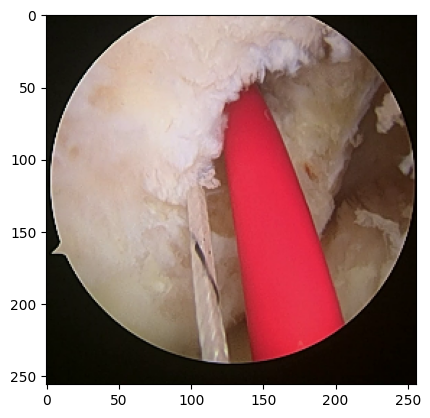

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Fiberstick suture: [INST]  
Describe the shape of the image? Select from options
0.A tubular structure with a curved or angled design, potentially marked with graduations for guidance.
1.A bowed or inclined cylindrical form, potentially bearing graduated notches
2.An elongated, tubular object with possibly marked or graduated sides, set against a darker background.
3.A curved or angled hollow shaft, possibly displaying calibrated markings
4.A tube-like object that is bent or curved, and may have measurements or markings on its exterior.
5.A versatile instrument featuring a pointed, sharp bit and a gripping mechanism with jaws, designed for precision and control during a medical procedure.
6.A multi-purpose instrument that includes a sharp, rotating bit paired with a grasping mechanism featuring jaws.
7.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
8.A combination tool with a sharp, possibly rotating drill bit alongside a grasping m

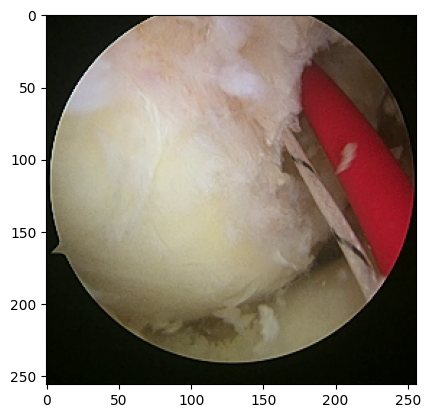

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Fiberstick suture: [INST]  
Describe the shape of the image? Select from options
0.A bowed or inclined cylindrical form, potentially bearing graduated notches
1.A curved, tubular guide with possible markings or gradations for precision.
2.A tubular structure with an angled or curved design, possibly including surface markings for accuracy.
3.An arched or bent tubular structure, potentially featuring measurement indicators
4.A bent or tilted tubular implement, potentially showing measurement gradations
5.A combination instrument with a sharp, pointed drill bit and a gripping mechanism.
6.In this situation the patient will be able to have more time with the doctor or the patient to talk 
7.A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image.
8.A composite instrument integrating a drilling component with a holding apparatus
9.A versatile implement merging a boring, twirling end with a c

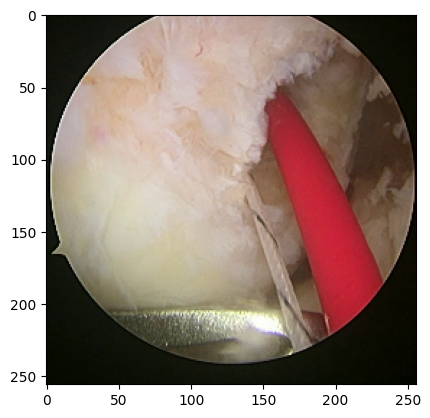

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Fiberstick suture: [INST]  
Describe the shape of the image? Select from options
0.A tubular structure with an angled or curved design, possibly including surface markings for accuracy.
1.A bowed or inclined cylindrical form, potentially bearing graduated notches
2.curved tube-like structure with markings on its surface, potentially with markings or gradations on 
3.In this regard, the following article, the second on the subject, has been addressed by the authors.
4.A curved or angled tube-like structure with markings.
5.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
6.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
7.A combination tool with a sharp, possibly rotating drill bit alongside a grasping mechanism.
8.A dual-purpose instrument with a pointed drill bit and a grasping mechanism with jaws.
9.In this situation the patient will be able to have more time wi

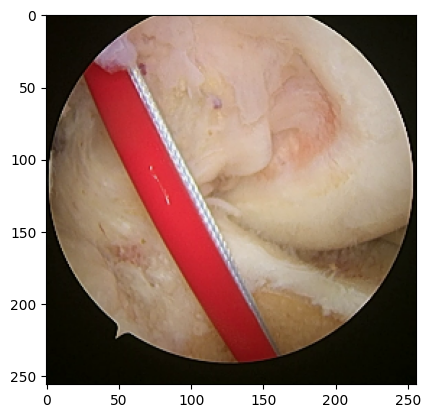

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Fiberstick suture: [INST]  
Describe the shape of the image? Select from options
0.A bent or angled tube-like tool, possibly featuring surface markings or graduations.
1.A curved or angled tube-like structure with markings.
2.An arcuate or slanted pipe-like tool, possibly exhibiting scaled indicators
3.An arched or bent tubular structure, potentially featuring measurement indicators
4.An elongated, tubular object with possibly marked or graduated sides, set against a darker background.
5.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
6.A surgical instrument with a sharp, pointed tip and a grasping mechanism with jaws, designed for medical procedures.
7.A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws.
8.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
9.In this situation the patient will be able to have more time with the doctor 

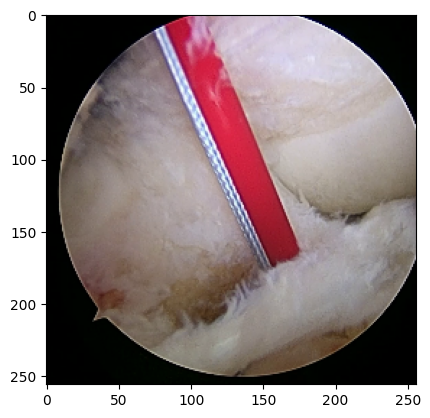

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Fiberstick suture: [INST]  
Describe the shape of the image? Select from options
0.A tube-like structure with markings for guiding internal meniscus repair.
1.An arched or bent tubular structure, potentially featuring measurement indicators
2.A curved or angled tube-like structure with markings.
3.A curved or angled tube-like guide with possible surface markings or measurement indicators.
4.A curved or angled hollow shaft, possibly displaying calibrated markings
5.A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image.
6.A dual-function tool, combining a sharp, spinning drill bit with a jawed grasper mechanism.
7.A composite instrument integrating a drilling component with a holding apparatus
8.A surgical instrument with a sharp, pointed tip and a grasping mechanism with jaws, designed for medical procedures.
9.A multifunctional tool uniting a perforating, revolving tip and a seizing me

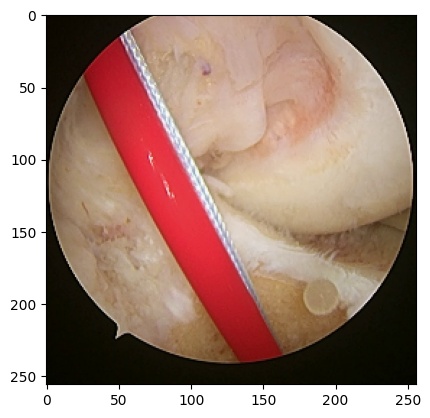

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Fiberstick suture: [INST]  
Describe the shape of the image? Select from options
0.A curved, tubular guide with possible markings or gradations for precision.
1.A curved or angled tube-like structure.
2.A tube-like structure with markings for guiding internal meniscus repair.
3.A tubular structure with an angled or curved design, possibly including surface markings for accuracy.
4.A bowed or inclined cylindrical form, potentially bearing graduated notches
5.We have used a sharp and pointed tool in the combination with a sharp, pointed, and rotating bit wit
6.A tool that combines a pointed, rotating drill bit with a grasping mechanism featuring jaws.
7.A dual-purpose tool combining a piercing, rotating tip with a clamping mechanism
8.A tool with a sharp, pointed drill bit and a pair of jaws for grasping.
9.A multifunctional tool uniting a perforating, revolving tip and a seizing mechanism
10.A compact, tubular device, possibly with a handle at one end for control.
11.A low-profile, tubu

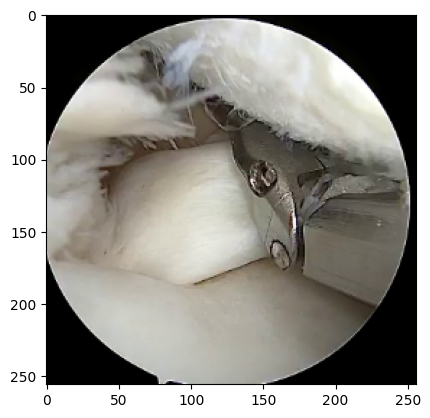

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Meniscus Single Pass Suture Device: [INST]  
Describe the shape of the image? Select from options
0.A slender, cylindrical device for internal meniscus surgery.
1.A compact, tubular device that may have a handle or grip on one end.
2.A narrow, cylindrical device, often featuring a handle at one end for operation.
3.What is the current status of the use of the RESPONSE?
4.A compact, rod-shaped tool with a potential control mechanism
5.A slender, malleable cord, perhaps looking stouter owing to connected stitching thread
6.A slender, flexible fiber with a suture material incorporated.
7.A slender, thread-like structure with a suture material attached.
8.a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material
9.A thin, flexible rod-like object with a suture material attached, which may appear slightly thicker.
10.A slender, elongated tool for a single-pass meniscus suture.
11.A slender, extended tool, potentially featuring a puncturing or relea

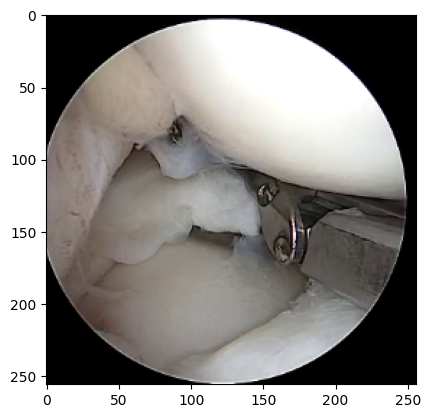

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Meniscus Single Pass Suture Device: [INST]  
Describe the shape of the image? Select from options
0.A small, cylindrical device for repairing the inside of the meniscus.
1.A slender, cylindrical object that could feature a grip on one side.
2.We can say that this system was not designed for use in the hands of an individual, and therefore no
3.A narrow, cylindrical device, often featuring a handle at one end for operation.
4.A long, tube-like instrument with a handle on one side.
5.A fine, flexible thread with an attached suture material, making it slightly thicker.
6.A fine, bendable strand, possibly seeming more substantial with affixed suturing material
7.a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material
8.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
9.A slender, malleable cord, perhaps looking stouter owing to connected stitching thread
10.A slender device, with a needle or de

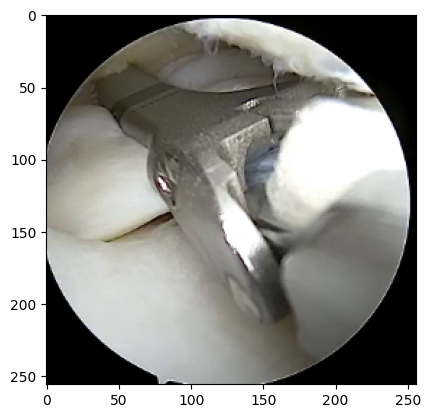

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Meniscus Single Pass Suture Device: [INST]  
Describe the shape of the image? Select from options
0.A low-profile, tubular tool with a handle mechanism.
1.A slender, tubular instrument for internal meniscus repair.
2.A sleek, cylindrical apparatus, possibly featuring a grip on one side.
3.A narrow, cylindrical device, often featuring a handle at one end for operation.
4.We can say that this system was not designed for use in the hands of an individual, and therefore no
5.A slender, flexible fiber with a suture material incorporated.
6.A slender, thread-like structure with a suture material attached.
7.A thin, supple fiber, potentially appearing beefier from attached surgical string
8.the "thin, flat, and thin" thread-like structure.
9.A thin, thread-like device with a suture attached.
10.The needle or delivery mechanism may be a passable device.
11.A narrow, stretched implement, possibly including a piercing or dispensing apparatus at one terminus
12.A slim, elongated tool with a needl

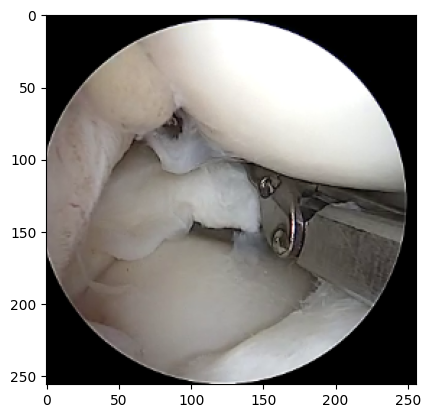

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Meniscus Single Pass Suture Device: [INST]  
Describe the shape of the image? Select from options
0.A narrow, elongated apparatus, perhaps including a manipulative component
1.A slender, cylindrical instrument, possibly featuring an operational end
2.A low-profile, tubular device, potentially with a handle mechanism on the other endósty.When searchi
3.A slim, tube-like implement that may incorporate a handling system
4.A compact, rod-shaped tool with a potential control mechanism
5.A slender, thread-like structure with a suture material attached.
6.The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance.
7.A thin, supple fiber, potentially appearing beefier from attached surgical string
8.A delicate, flexible fiber with a suture incorporated.
9.A slender, flexible fiber with a suture material incorporated.
10.A device for efficiently suturing the meniscus in a single pass.
11.The needle is connected 

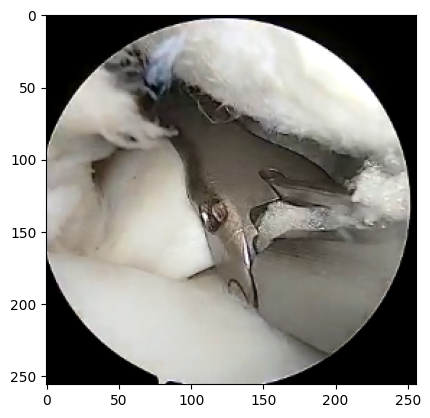

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Meniscus Single Pass Suture Device: [INST]  
Describe the shape of the image? Select from options
0.A slender, cylindrical device for internal meniscus surgery.
1.A slender, tubular instrument for internal meniscus repair.
2.A compact, tubular device that may have a handle or grip on one end.
3.A sleek, cylindrical apparatus, possibly featuring a grip on one side.
4.A compact, rod-shaped tool with a potential control mechanism
5.A thin, pliable thread, potentially appearing thicker due to the attached suturing material.
6.a very thick or a very thin suture material.RESPONSE: a very thin or a thin thread-like structure, p
7.thin threads, not necessarily appearing thick and therefore possibly appearing slightly thickened du
8.A fine, bendable strand, possibly seeming more substantial with affixed suturing material
9.A slender, flexible fiber with a suture material incorporated.
10.A thin, prolonged instrument, possibly incorporating a needle or deployment system at one extremity
11.A dev

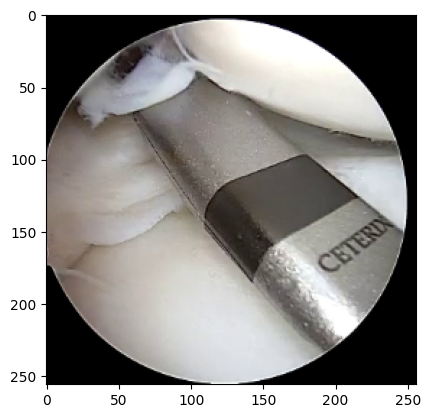

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Meniscus Single Pass Suture Device: [INST]  
Describe the shape of the image? Select from options
0.A compact, cylindrical instrument with a handle on one side.
1.A low-profile, tubular device, potentially with a handle mechanism on the other endósty.When searchi
2.A compact, tubular device, possibly with a handle at one end for control.
3.A low-profile, tubular tool with a handle mechanism.
4.One-level, minimally invasive, minimally invasive, less invasive.
5.A thin, supple fiber, potentially appearing beefier from attached surgical string
6.A thin, pliable thread, potentially appearing thicker due to the attached suturing material.
7.A thin, flexible rod-like object with a suture material attached, which may appear slightly thicker.
8.A delicate, pliable filament, potentially appearing robust due to attached surgical thread
9.A thin, flexible thread-like structure that is noticeably thicker due to the attached suture material.
10.A sleek, elongated apparatus, potentially featuring a 

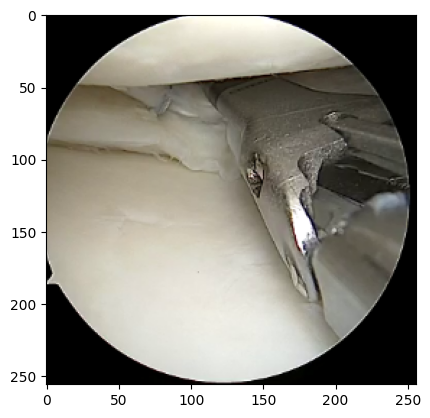

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


Meniscus Single Pass Suture Device: [INST]  
Describe the shape of the image? Select from options
0.A slender, cylindrical instrument, possibly featuring an operational end
1.A slender, tubular instrument for internal meniscus repair.
2.We can say that this system was not designed for use in the hands of an individual, and therefore no
3.A compact, tubular device, possibly with a handle at one end for control.
4.A low-profile, tubular device with a handle for easy use.
5.A thin, pliable thread, potentially appearing thicker due to the attached suturing material.
6.A fine, flexible thread with an attached suture material, making it slightly thicker.
7.A thin, flexible thread-like structure that is noticeably thicker due to the attached suture material.
8.A delicate, flexible fiber with a suture incorporated.
9.A flexible, thread-like structure, slightly thickened due to its suture material.
10.A narrow and long instrument, which might have a needle or a delivery system at one end, inten

In [73]:
outputs=[]
evalmetric =[]
for image_path, options, options_labels, gt, gtOpts in list(zip(mapping["file_path"], mapping["options"], 
                                                                mapping["options_labels"], mapping["ground_truth"], 
                                                                mapping['ground_truth_options'])):
    print("\n \n-------------------------------------------------")
    similarity=[]
    print(image_path)

    image = Image.open(image_path)
    plt.imshow(image)
    plt.show()
    
    prompt_text = "Describe the shape of the image? Select from options"

    for idx, opt in enumerate(options):
        prompt_text += "\n" +f"{idx}."+ opt 
        
    #prompt_text += "Select from options"
    
    # Prepare inputs
    # Use gemma chat template
    prompt = processor.tokenizer.apply_chat_template(
        [{'role': 'user', 'content': "<image>\n"+prompt_text}],
        tokenize=False,
        add_generation_prompt=True
    )
    

    inputs = processor(text=prompt, images=image, return_tensors="pt").to("cuda:0")

    # Generate
    generate_ids   = vlm_model.generate(**inputs, max_length=2000)
    generated_text = processor.batch_decode(generate_ids, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]

    MCQ, reply = generated_text.split("[/INST]")
    

    #generated_text =  generated_text.split("model")[-1]#[:100] 
    
    print(f"{gt}:", MCQ)
    print("\n\nResponse:", reply)

    print("\n##### check similarity GT #####\n")


    paragraph_emb = model.encode(reply)
    for opt in gtOpts:      
        # Encode sentences into embeddings        
        option_emb = model.encode(opt)
        
        # Compute cosine similarity
        sim = util.cos_sim(paragraph_emb, option_emb)
        similarity.append(sim)
        print(f"Similarity to Option : {sim} = {opt}")


    print("\n##### check similarity between all options #####\n")

    print(f"--- Ground Truth: {gt}" )
    
    for idx, opt in enumerate(options):      
        # Encode sentences into embeddings        
        option_emb = model.encode(opt)
        
        # Compute cosine similarity
        sim = util.cos_sim(paragraph_emb, option_emb)
        similarity.append(sim)
        print(f"Similarity to Option : {sim} = {options_labels[idx]} | {opt}")

    
    evalmetric.append(similarity)
    print("\n \n-------------------------------------------------")


    
    outputs.append((image_path, gt, reply, MCQ))

In [74]:
# evalmetric

In [75]:
len(evalmetric)

72

In [76]:
avg_similarity = torch.mean(torch.stack(similarity))

In [77]:
avg_similarity

tensor(0.4254)

In [78]:
# !pip install ir-metrics

In [79]:
## Evaluate Recall@K and ARR

In [80]:
## prepare for evaluation:

In [81]:
cls_to_id

{'Fiberstick suture': 0,
 'Drill bit and grasper': 1,
 'Acorn reamer': 2,
 'Inside Out Meniscal Repair Guide': 3,
 'Forceps': 4,
 'All inside meniscus repair device': 5,
 'Microfracture Awl': 6,
 'Curette': 7,
 'Meniscus Single Pass Suture Device': 8}

In [82]:
id_to_cls

{0: 'Fiberstick suture',
 1: 'Drill bit and grasper',
 2: 'Acorn reamer',
 3: 'Inside Out Meniscal Repair Guide',
 4: 'Forceps',
 5: 'All inside meniscus repair device',
 6: 'Microfracture Awl',
 7: 'Curette',
 8: 'Meniscus Single Pass Suture Device'}

In [83]:
import irmetrics
from sentence_transformers import SentenceTransformer, util


In [84]:
from irmetrics.topk import rr
from irmetrics.topk import recall
from irmetrics.topk import ap

In [85]:
dataset_rr = []
dataset_ap = []
dataset_recall_top3 = []
dataset_recall = []
gt_cls = []

In [105]:
for out in outputs:
    image_path, gt, reply, _ = out
    
    retrieved_outputs = retriever.get_relevant_documents(reply)

    print("\n \n ---------------------------")
    print(f"Ground truth {gt}")
    print("Response:", reply)
    print("Retrieval:",len(retrieved_outputs))

    gt_cls.append(gt)
    paragraph_emb=model.encode(reply)

    response_cls = []
    for cls, desc in retrieved_outputs:
        option_emb=model.encode(desc)
        sim_score = util.cos_sim(paragraph_emb, option_emb)
        print(cls, desc, sim_score)
        
        response_cls.append(cls)

    y_true = cls_to_id[gt]
    y_pred = [cls_to_id[res] for res in response_cls]

    dataset_rr.append(rr(y_true,y_pred))
    dataset_ap.append(ap(y_true,y_pred))
    dataset_recall_top3.append(recall(y_true,y_pred, k=3)/ 3)
    dataset_recall.append(recall(y_true,y_pred)/ 5)

    print(y_true)
    print(y_pred)
    print("recall:",recall(y_true,y_pred))
    print("recall @ 3:", recall(y_true,y_pred, k=3))

    
    


 
 ---------------------------
Ground truth Microfracture Awl
Response:  The image depicts a medical instrument being inserted into a narrow, curved space, likely within a human body. The instrument appears to be a slender, pointed device with a delicate and thin form, possibly resembling a tiny awl or pick. It is being used to navigate through a confined area, which could be a surgical procedure or an intervention in a medical setting. The instrument's design suggests that it is intended for precise and delicate work, requiring a high level of control and precision. 
Retrieval: 5
Microfracture Awl An instrument with a fine point, akin to a small awl or pick, is being used to navigate through a narrow, curved space. tensor([[0.7352]])
Microfracture Awl A thin, needle-like instrument that is inserted into a medical procedure or surgery. tensor([[0.6725]])
Microfracture Awl A small, pointed instrument resembling a tiny awl or pick, used for delicate procedures. tensor([[0.6499]])
Inside

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Fiberstick suture The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance. tensor([[1.0000]])
Fiberstick suture A thin, flexible thread-like structure with a suture attached. tensor([[0.8745]])
Fiberstick suture A slender, thread-like structure with a suture material attached. tensor([[0.8686]])
Fiberstick suture a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material tensor([[0.8378]])
Fiberstick suture A fine, flexible thread, which may appear slightly thicker due to its attached suture material. tensor([[0.8318]])
6
[0, 0, 0, 0, 0]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Microfracture Awl
Response:  The image shows a surgical instrument with a pointed, sharp end and a gripping feature with jaws, which is likely designed for twisting or rotating. It appears to be a versatile instrument that could be used in arthroscopy, a

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Drill bit and grasper A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws. tensor([[0.6822]])
2
[1, 2, 2, 2, 1]
recall: 3.0
recall @ 3: 2.0

 
 ---------------------------
Ground truth Acorn reamer
Response:  The image shows a small, round, and metallic object with a textured or fluted surface. It appears to be a surgical instrument, possibly a drill or a similar tool, given its shape and the presence of a number on it, which could indicate its size or model number. The object is partially covered in a white substance, which might be a sterilizing agent or a protective coating. The image is taken from a close-up perspective, focusing on the object, and the background is not clearly visible. 
Retrieval: 5
Acorn reamer An object with a metal surface that has a textured or fluted pattern, shaped like a circle, is depicted in the image. tensor([[0.6982]])
Acorn reamer A small, cylindrical metal tool with a textured surface.

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Drill bit and grasper A combination tool which has to be chosen to be a part of the arthroscopic surgery to be performed. tensor([[0.6631]])
Drill bit and grasper A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws. tensor([[0.6513]])
Microfracture Awl A delicate, pointed instrument for microfracture surgery. tensor([[0.6432]])
Microfracture Awl A thin, needle-like instrument that is inserted into a medical procedure or surgery. tensor([[0.6386]])
Drill bit and grasper A surgical instrument with a sharp, pointed tip and a grasping mechanism with jaws, designed for medical procedures. tensor([[0.6358]])
2
[1, 1, 6, 6, 1]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Acorn reamer
Response:  The image shows a close-up of a metallic object with a textured surface, possibly a tool or a part of a larger assembly. It appears to be a cylindrical or tubular shape with a pointed, sharp tip. The object i

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Inside Out Meniscal Repair Guide A tube-like structure with markings for guiding internal meniscus repair. tensor([[0.5093]])
5
[0, 2, 0, 0, 3]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth All inside meniscus repair device
Response:  The image shows a surgical instrument being used in a medical procedure. The instrument appears to be a thin, flexible thread-like structure that is noticeably thicker due to the attached suture material. It is being inserted into a surgical site, possibly a knee joint, as indicated by the surrounding tissue and bone. The instrument is likely being used to repair or reconstruct the tissue within the joint. 
Retrieval: 5
Fiberstick suture A thin, thread-like device with a suture attached. tensor([[0.7119]])
Fiberstick suture A slender, thread-like structure with a suture material attached. tensor([[0.6834]])
Microfracture Awl A thin, needle-like instrument that is inserted into a medical procedure or surgery. tensor([[0.6779]])
F

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Acorn reamer A small, spherical metal tool with a fluted or textured exterior. tensor([[0.6620]])
All inside meniscus repair device A cylindrical instrument with a rounded end, possibly equipped with a handle for manipulation. tensor([[0.6543]])
All inside meniscus repair device A slender, cylindrical instrument, possibly featuring an operational end tensor([[0.6477]])
5
[3, 2, 2, 5, 5]
recall: 2.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth All inside meniscus repair device
Response:  The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance. 
Retrieval: 5
Fiberstick suture The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance. tensor([[1.0000]])
Fiberstick suture A thin, flexible thread-like structure with a suture attached. tensor([[0.8745]])
Fiberstick suture A slender, thread-like structure wi

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Drill bit and grasper A combination tool which has to be chosen to be a part of the arthroscopic surgery to be performed. tensor([[0.5776]])
Microfracture Awl A thin, needle-like instrument that is inserted into a medical procedure or surgery. tensor([[0.5765]])
Drill bit and grasper A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image. tensor([[0.5709]])
Inside Out Meniscal Repair Guide A curved metal rod with markings or gradations visible on its surface, An instrument with a tube-like shape, designed for use in a medical or surgical setting. tensor([[0.5644]])
Microfracture Awl A small, pointed instrument resembling a tiny awl or pick, used for delicate procedures. tensor([[0.5604]])
5
[1, 6, 1, 3, 6]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth All inside meniscus repair device
Response:  The image shows a thin, flexible thread-like structure that has b

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Fiberstick suture A thin, flexible rod-like object with a suture material attached, which may appear slightly thicker. tensor([[0.9250]])
Fiberstick suture The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance. tensor([[0.8784]])
Fiberstick suture A slender, bendable object with a suture attached, that might look a bit thicker because of the suture material. tensor([[0.8524]])
Fiberstick suture A slender, bendable rod, with a suture attached to it, which might appear a bit thicker due to the suture material. tensor([[0.8418]])
Fiberstick suture A slender, thread-like structure with a suture material attached. tensor([[0.8173]])
7
[0, 0, 0, 0, 0]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Curette
Response:  The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance. This could be a part 

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Fiberstick suture The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance. tensor([[1.0000]])
Fiberstick suture A thin, flexible thread-like structure with a suture attached. tensor([[0.8745]])
Fiberstick suture A slender, thread-like structure with a suture material attached. tensor([[0.8686]])
Fiberstick suture a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material tensor([[0.8378]])
Fiberstick suture A fine, flexible thread, which may appear slightly thicker due to its attached suture material. tensor([[0.8318]])
7
[0, 0, 0, 0, 0]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Curette
Response:  The image shows a surgical instrument with a pointed, sharp tip and a grasping mechanism with jaws. It appears to be a versatile surgical instrument that could be used for various procedures, such as perforating, rotating, and grasping

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the


 
 ---------------------------
Ground truth Drill bit and grasper
Response:  The image depicts a surgical instrument with a curved or angled design, possibly including surface markings for accuracy. It appears to be a versatile instrument featuring a pointed, sharp bit and a gripping mechanism with jaws, designed for precision and control during a medical procedure. 
Retrieval: 5
Drill bit and grasper A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws. tensor([[0.7942]])
Drill bit and grasper A surgical instrument with a sharp, pointed tip and a grasping mechanism with jaws, designed for medical procedures. tensor([[0.7599]])
Drill bit and grasper A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image. tensor([[0.7344]])
Drill bit and grasper A versatile instrument featuring a pointed, sharp bit and a gripping mechanis

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Microfracture Awl A delicate, pointed instrument for microfracture surgery. tensor([[0.6691]])
Drill bit and grasper A versatile instrument featuring a pointed, sharp bit and a gripping mechanism with jaws, designed for precision and control during a medical procedure. tensor([[0.6668]])
4
[1, 1, 1, 6, 1]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Forceps
Response:  The image shows a close-up of a surgical instrument inside a surgical cavity, which appears to be a knee joint. The instrument has a metallic shaft with a suture attached to it, and there is a white substance that could be bone or tissue debris on the instrument. The instrument is not clearly identifiable as a specific type of surgical tool, but it seems to be designed for arthroscopic surgery, which is a minimally invasive procedure used to diagnose and treat joint problems. The exact shape and function of the instrument are not fully visible in the image. 
Retrieval: 5
Drill bit and grasper A

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Acorn reamer A small, cylindrical metal tool with a textured surface. tensor([[0.6545]])
Acorn reamer A small, spherical metal tool with a fluted or textured exterior. tensor([[0.6498]])
Drill bit and grasper A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws. tensor([[0.6441]])
4
[1, 1, 2, 2, 1]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Forceps
Response:  The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance. 
Retrieval: 5
Fiberstick suture The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance. tensor([[1.0000]])
Fiberstick suture A thin, flexible thread-like structure with a suture attached. tensor([[0.8745]])
Fiberstick suture A slender, thread-like structure with a suture material attached. tensor([[0.8686]])


/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Drill bit and grasper A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws. tensor([[0.7525]])
Drill bit and grasper A surgical instrument with a sharp, pointed tip and a grasping mechanism with jaws, designed for medical procedures. tensor([[0.7337]])
Microfracture Awl A small, pointed instrument resembling a tiny awl or pick, used for delicate procedures. tensor([[0.6483]])
Drill bit and grasper A combination tool which has to be chosen to be a part of the arthroscopic surgery to be performed. tensor([[0.6402]])
4
[1, 1, 1, 6, 1]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Forceps
Response:  The image you've provided appears to be a close-up view of a surgical instrument, possibly a part of an arthroscopic surgery setup. The instrument has a metallic shaft with a pointed tip, which is likely used for penetrating tissue or joint spaces during a procedure. The shaft is partially covered with 

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Microfracture Awl the surgeon, surgeon who is familiar with the technique of arthroscopy and the surgical instruments, tensor([[0.5043]])
Fiberstick suture The image shows a thin, flexible thread-like structure that has been attached to some suture material, giving it a slightly thicker appearance. tensor([[0.5012]])
Drill bit and grasper A combination tool which has to be chosen to be a part of the arthroscopic surgery to be performed. tensor([[0.4643]])
Inside Out Meniscal Repair Guide A tube-like structure with markings for guiding internal meniscus repair. tensor([[0.4528]])
Fiberstick suture a thin fibrous structure, potentially appearing slightly thicker due to the attached suture material tensor([[0.4497]])
3
[6, 0, 1, 3, 0]
recall: 1.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Inside Out Meniscal Repair Guide
Response:  The image shows a medical instrument being inserted into a body cavity, likely during a medical procedure. The instrument appears to be a thi

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the


 
 ---------------------------
Ground truth Inside Out Meniscal Repair Guide
Response:  The image you've provided appears to be a medical or surgical instrument, possibly a guide or tool used in orthopedic or arthroscopic procedures. It is difficult to determine the exact shape or function of the instrument without more context or a clearer view of the entire object. However, based on the visible parts, it seems to be a thin, flexible, and possibly thread-like structure that could be used for a variety of purposes, such as guiding internal meniscus repair or suturing. The instrument is set against a darker background, which might be a surgical field or a sterile environment. 
Retrieval: 5
Drill bit and grasper A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image. tensor([[0.6739]])
Fiberstick suture The image shows a thin, flexible thread-like structure that has been attached to some

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

All inside meniscus repair device A slender, tubular instrument for internal meniscus repair. tensor([[0.6657]])
0
[5, 3, 5, 3, 5]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Fiberstick suture
Response:  The image appears to show a medical instrument, possibly a surgical tool, with a curved, tubular design. It has a pointed, sharp end and a gripping feature with jaws, which suggests that it may be used for twisting or rotating. The instrument is inserted into a body cavity, as indicated by the surrounding tissue and the presence of a suture material. The exact purpose of the instrument is not clear from the image alone, but it could be used for a variety of surgical procedures, such as drilling, cutting, or manipulating tissue. The image does not provide enough information to confidently determine the specific type of instrument or its exact function. 
Retrieval: 5
Drill bit and grasper A versatile instrument featuring a pointed, sharp end and a gripping fe

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Drill bit and grasper A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image. tensor([[0.7803]])
Drill bit and grasper A versatile instrument featuring a pointed, sharp bit and a gripping mechanism with jaws, designed for precision and control during a medical procedure. tensor([[0.7560]])
Microfracture Awl A small, pointed instrument resembling a tiny awl or pick, used for delicate procedures. tensor([[0.7119]])
0
[1, 1, 1, 1, 6]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Fiberstick suture
Response:  The image shows a surgical instrument with a red handle and a curved, tubular shaft. The shaft appears to be made of a flexible material, possibly a thin, flexible fiber, and it is inserted into a surgical site, likely a knee joint, as indicated by the visible bone and tissue. The instrument is likely used for arthroscopic procedures, such as knee surgery, whe

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

Microfracture Awl A thin, needle-like instrument that is inserted into a medical procedure or surgery. tensor([[0.6234]])
Drill bit and grasper A surgical instrument with a sharp, pointed tip and a grasping mechanism with jaws, designed for medical procedures. tensor([[0.6058]])
Drill bit and grasper A versatile instrument featuring a pointed, sharp end and a gripping feature with jaws, potentially designed for twisting or rotating, is seen in the image. tensor([[0.5958]])
Microfracture Awl A small, pointed instrument resembling a tiny awl or pick, used for delicate procedures. tensor([[0.5928]])
Drill bit and grasper A versatile surgical instrument with a sharp, pointed, and potentially rotating tip and a grasping mechanism with jaws. tensor([[0.5896]])
8
[6, 1, 1, 6, 1]
recall: 0.0
recall @ 3: 0.0

 
 ---------------------------
Ground truth Meniscus Single Pass Suture Device
Response:  The image shows a thin, flexible fiber with a suture material incorporated. 
Retrieval: 5
Fibersti

/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the predictions are padded. Use np.nan as a padding token to suppress the warning for integer labels.
  warnings.warn(message, RuntimeWarning)
/home/kunal/miniconda3/lib/python3.8/site-packages/irmetrics/io.py:40: RuntimeWarning: Repeated predictions detected. This is an error unless the

In [95]:
MeanRR = torch.mean(torch.tensor(dataset_rr))

In [96]:
MeanRR

tensor(0.2134)

In [97]:
MeanAP = torch.mean(torch.tensor(dataset_ap)) 

In [98]:
MeanAP

tensor(0.0333)

In [99]:
Recall_at_3 = torch.mean(torch.tensor(dataset_recall_top3)) 

In [100]:
Recall_at_3

tensor(0.1806)

In [101]:
Recall = torch.mean(torch.tensor(dataset_recall)) 

In [102]:
Recall

tensor(0.1694)

In [107]:
class_wise_recall = {}

for rec, gt in list(zip(dataset_recall, gt_cls)):
    if gt not in class_wise_recall.keys():
        class_wise_recall[gt] = []

    class_wise_recall[gt].append(rec)

In [110]:
for key in class_wise_recall.keys():
    print(key, torch.mean(torch.tensor(class_wise_recall[key])))

Microfracture Awl tensor(0.2400)
Acorn reamer tensor(0.8000)
All inside meniscus repair device tensor(0.1636)
Curette tensor(0.)
Drill bit and grasper tensor(0.2667)
Forceps tensor(0.)
Inside Out Meniscal Repair Guide tensor(0.0333)
Fiberstick suture tensor(0.)
Meniscus Single Pass Suture Device tensor(0.1429)
